# RA Single cell Project Figure 3

<br>

**Description**:This Jupyternotebook summarise all the helper function used for the single cell analysis \
**Author**: Brenda Miao - Marie Binvignat\
**Version**: 1.0  
**Last updated**: 02/01/23

<br>

**<font size="2">Single Cell Transcriptomics Analysis of Blood Immune Cells Identifies Gene Signatures and Cell Subsets Associated with Disease Activity in a Diverse Population of Rheumatoid Arthritis Patients<font>**
<br>  
<font size="2"> Binvignat M*, Miao B*, Wibrand C, Yang M, Rychkov D, Flynn E, Nititham J, Carvidi A, Krueger M, Niemi E, Sun Y, Klatzmann D, Mariotti-Ferrandiz E, Sellam J,Gross A, Ye J, Butte AJ, Criswell LA, Nakamura M, Sirota <font><br>
<font size="1"> **equal contribution* <font> 

# Load functions

In [1]:
## start here
# get functions
from functions.preprocessing import *
from functions.DEGAnalysis import *

#sns.set_style("ticks")
#sns.set_context("talk")

sns.set(style="ticks")
sns.set_context("notebook")

# Rough annotation proportion analysis 

computing density on 'umap'


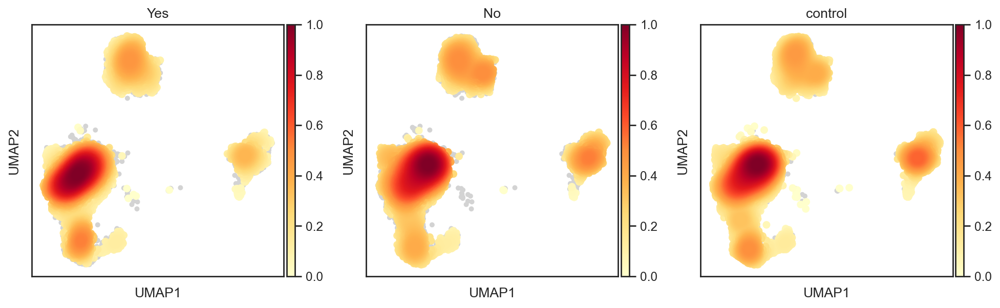

RA disease activity vs control (paired pvals): {'Bcells': 0.8125, 'CD4Tcells': 0.46875, 'CD8Tcells': 0.8125, 'Monocytes': 0.8125, 'NKcells': 0.46875}
RA no disease activity vs control (paired pvals): {'Bcells': 0.359375, 'CD4Tcells': 1.0, 'CD8Tcells': 0.734375, 'Monocytes': 0.25, 'NKcells': 0.91015625}


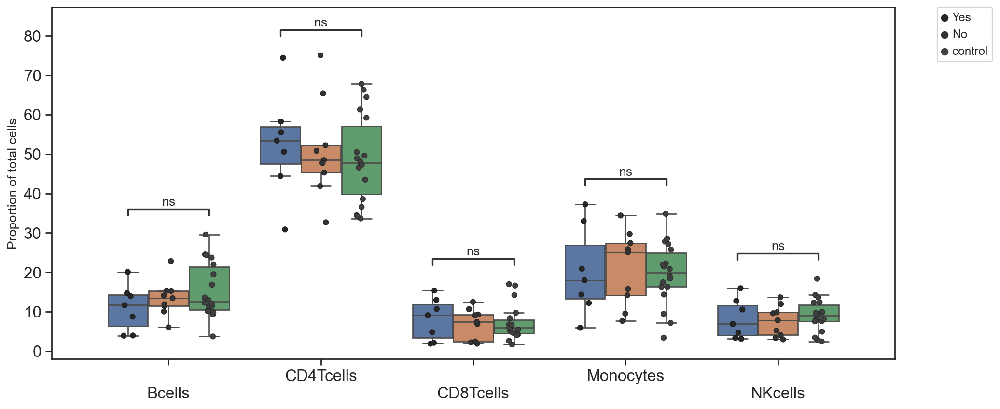

In [3]:
inputPath = './dataOutput/adata/final.h5ad'
adata = sc.read(inputPath)
adata.uns['log1p']['base'] = None 
### Disease activity (Yes vs no vs control)
# Density plot
sc.tl.embedding_density(adata, basis='umap', groupby="activity_python_binary_crp")
sc.pl.embedding_density(adata, basis='umap', key="umap_density_activity_python_binary_crp", 
                            group=["Yes", "No", "control"], save="Figure3A_all.pdf")

# unpaired analysis
cell_subset_df = compositionalAnalysis(adata, hue_groups=["Yes", "No", "control"], corr=None, hue="activity_python_binary_crp", 
                      subset_col="rough_annot",  sample_col="Sample", single_pair=True, height=6, 
                                       filename= "./figures/Figure3B_all_proportion_RAActivity.pdf",
                      width=14, min_cells=0, density=False, stats_test=scipy.stats.kruskal, 
                      return_df=True)

# Paired testing statistics
cell_subset_df["pair_index_CW"] = cell_subset_df["Sample"].map(dict(zip(adata.obs["Sample"], adata.obs["pair_index_CW"])))
pvals = pairedTestByCellType(cell_subset_df, subset_col="rough_annot", groupby="activity_python_binary_crp", 
                     groupA="Yes", groupB="control",  pair_index="pair_index_CW", 
                     compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
print("RA disease activity vs control (paired pvals): %s"%str(pvals))

pvals = pairedTestByCellType(cell_subset_df, subset_col="rough_annot", groupby="activity_python_binary_crp", 
                     groupA="No", groupB="control",  pair_index="pair_index_CW", 
                     compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
print("RA no disease activity vs control (paired pvals): %s"%str(pvals))




## Figure 3 

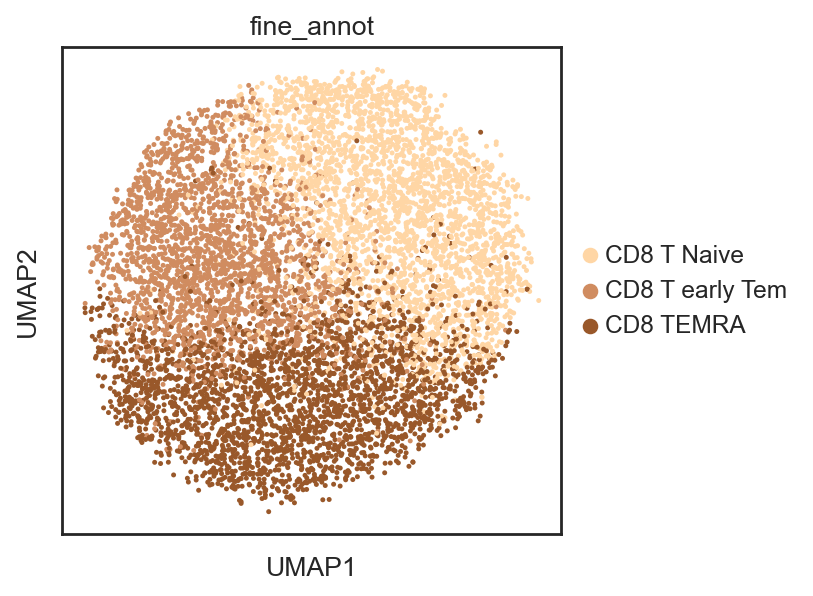

RA vs control (paired pvals): {'CD8 T Naive': 0.3778228759765625, 'CD8 T early Tem': 0.17425537109375, 'CD8 TEMRA': 1.0}
RA disease activity vs control (paired pvals): {'CD8 T Naive': 0.46875, 'CD8 T early Tem': 0.6875, 'CD8 TEMRA': 0.375}
RA no disease activity vs control (paired pvals): {'CD8 T Naive': 0.7421875, 'CD8 T early Tem': 0.1484375, 'CD8 TEMRA': 0.3125}


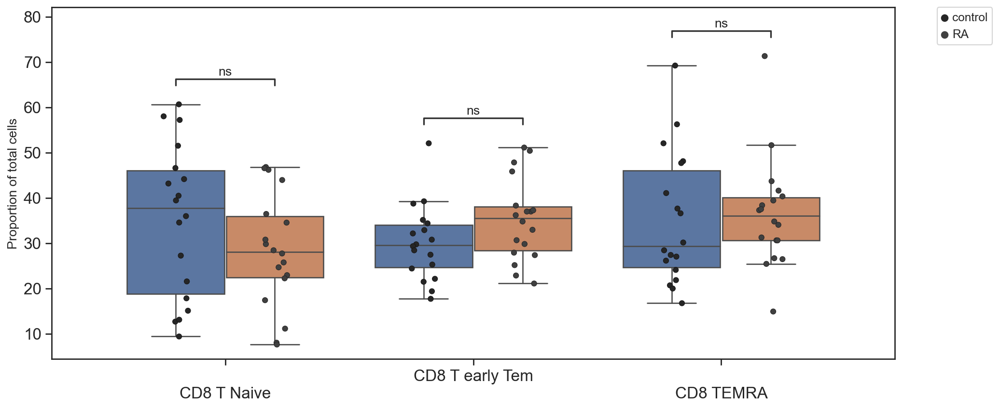

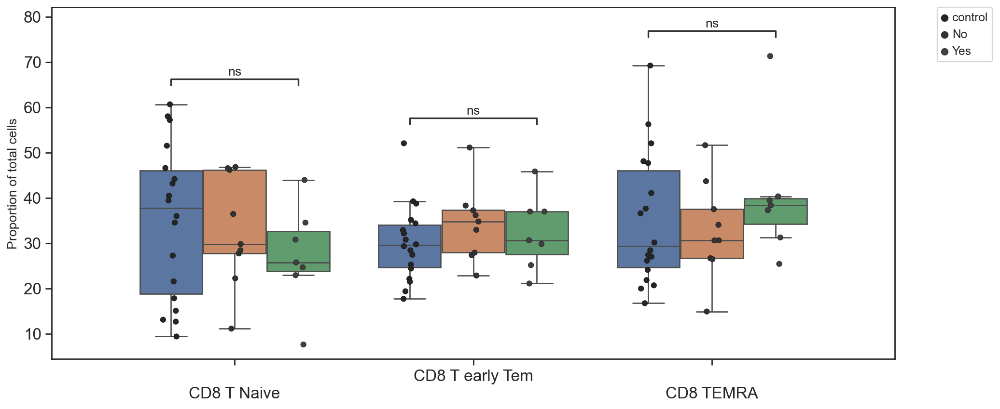

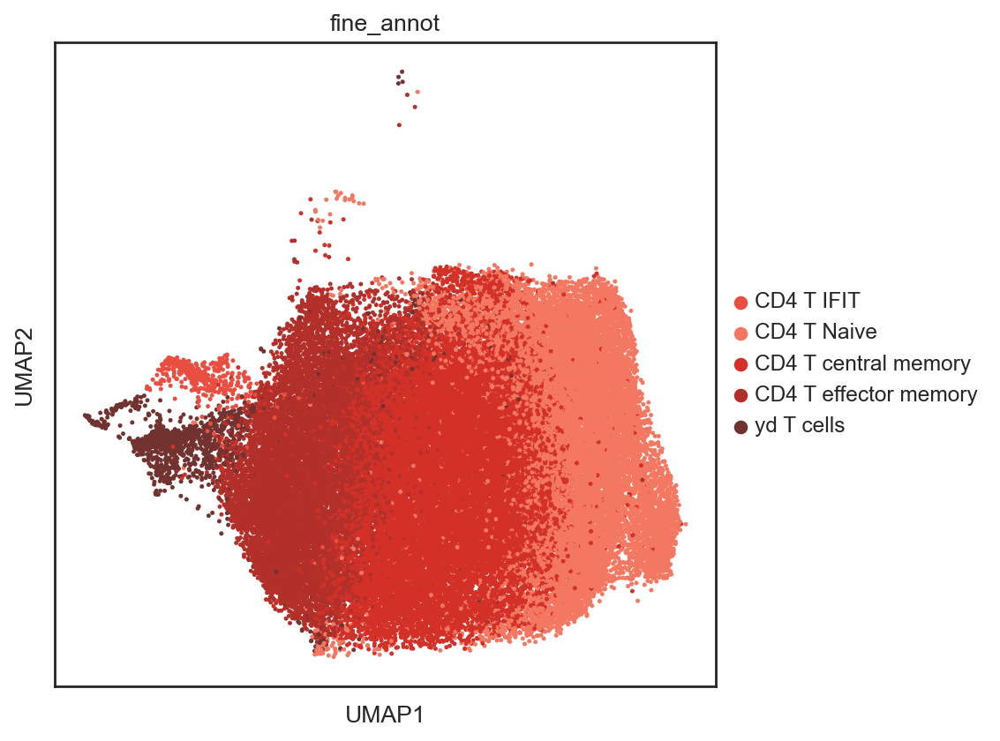

RA vs control (paired pvals): {'CD4 T IFIT': 0.981116590883351, 'CD4 T Naive': 0.4171142578125, 'CD4 T central memory': 0.34654998779296875, 'CD4 T effector memory': 0.7018814086914062, 'yd T cells': 0.49507904052734375}
RA disease activity vs control (paired pvals): {'CD4 T IFIT': 0.46875, 'CD4 T Naive': 0.296875, 'CD4 T central memory': 0.15625, 'CD4 T effector memory': 0.6875, 'yd T cells': 1.0}
RA no disease activity vs control (paired pvals): {'CD4 T IFIT': 0.32698934959801507, 'CD4 T Naive': 1.0, 'CD4 T central memory': 0.65234375, 'CD4 T effector memory': 0.65234375, 'yd T cells': 0.30078125}


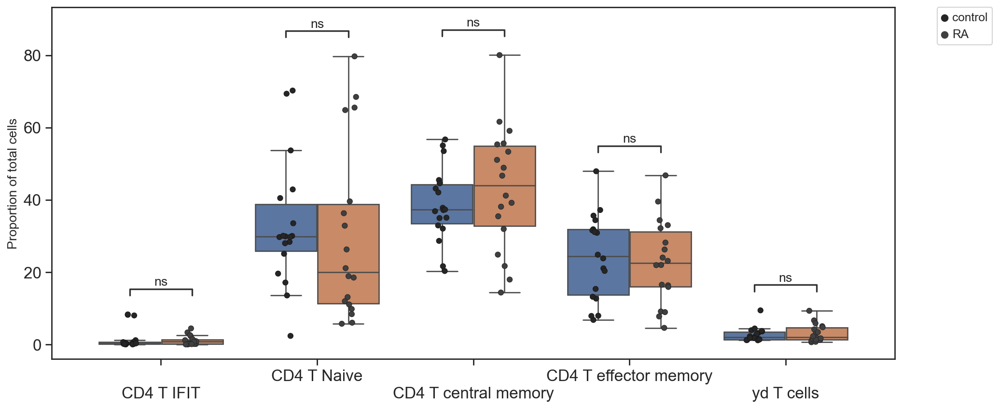

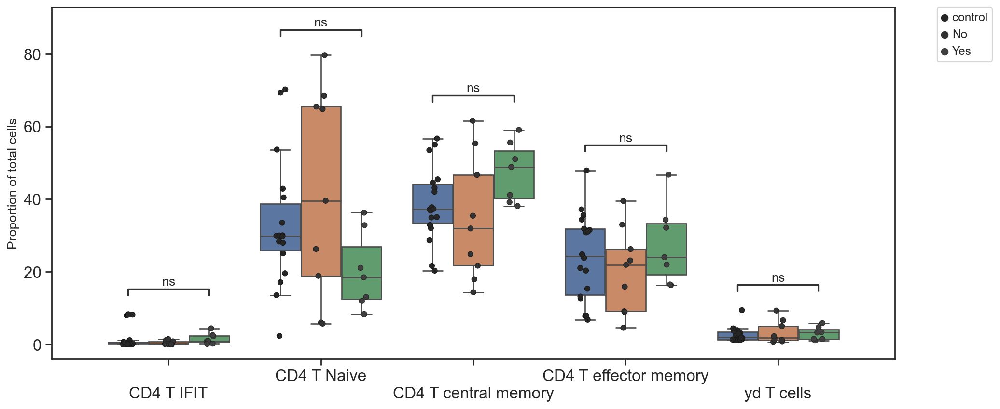

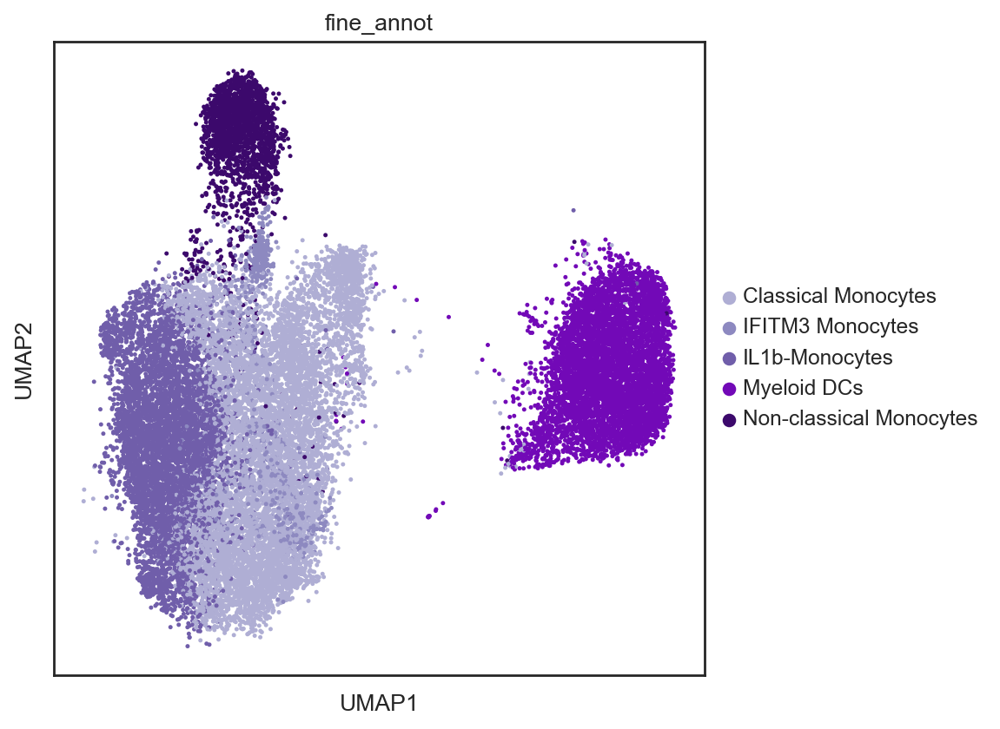

RA vs control (paired pvals): {'Classical Monocytes': 0.8650436401367188, 'IFITM3 Monocytes': 0.5861743444807836, 'IL1b-Monocytes': 0.550872802734375, 'Myeloid DCs': 0.49507904052734375, 'Non-classical Monocytes': 0.02367401123046875}
RA disease activity vs control (paired pvals): {'Classical Monocytes': 0.8125, 'IFITM3 Monocytes': 0.015625, 'IL1b-Monocytes': 0.9375, 'Myeloid DCs': 0.109375, 'Non-classical Monocytes': 0.21875}
RA no disease activity vs control (paired pvals): {'Classical Monocytes': 0.65234375, 'IFITM3 Monocytes': 0.12348527214454898, 'IL1b-Monocytes': 0.8203125, 'Myeloid DCs': 0.42578125, 'Non-classical Monocytes': 0.42578125}


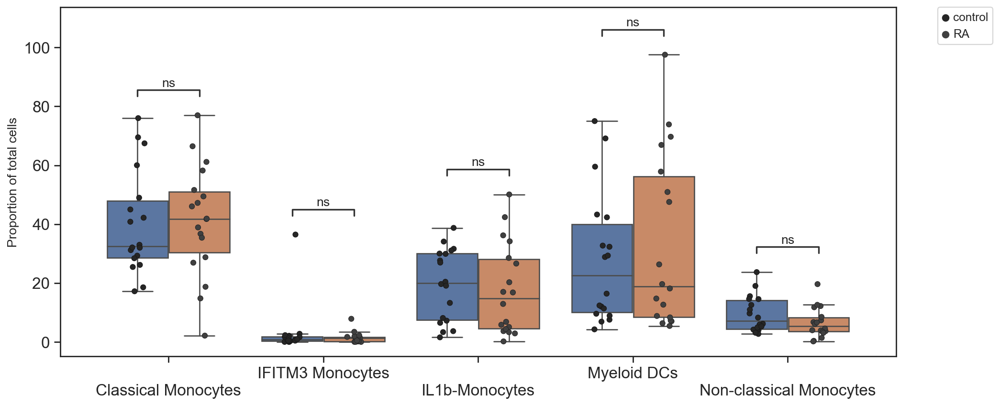

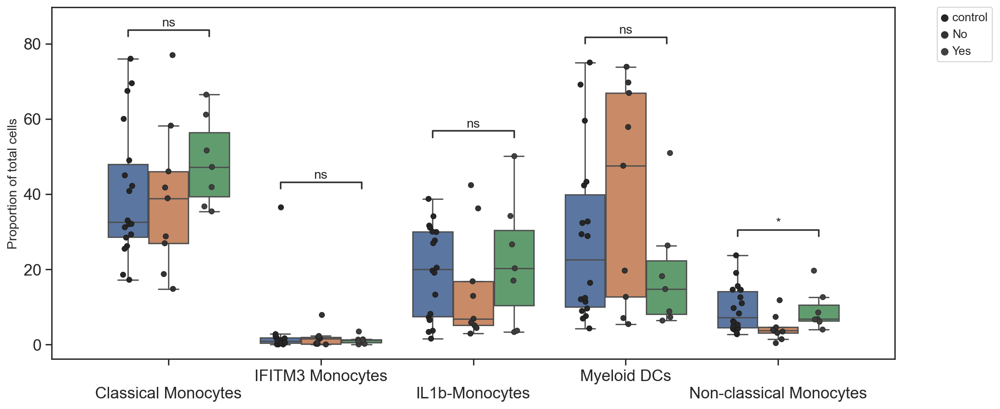

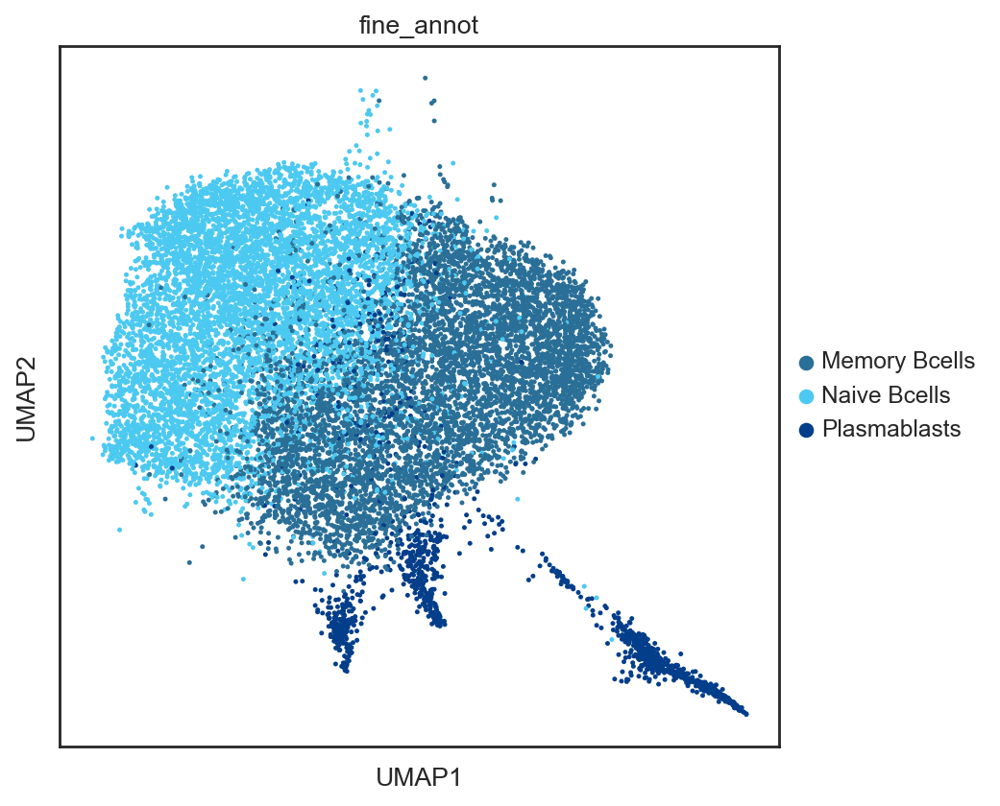

RA vs control (paired pvals): {'Memory Bcells': 0.30379486083984375, 'Naive Bcells': 0.4171142578125, 'Plasmablasts': 0.0599365234375}
RA disease activity vs control (paired pvals): {'Memory Bcells': 0.078125, 'Naive Bcells': 0.109375, 'Plasmablasts': 0.21875}
RA no disease activity vs control (paired pvals): {'Memory Bcells': 0.5703125, 'Naive Bcells': 0.42578125, 'Plasmablasts': 0.359375}


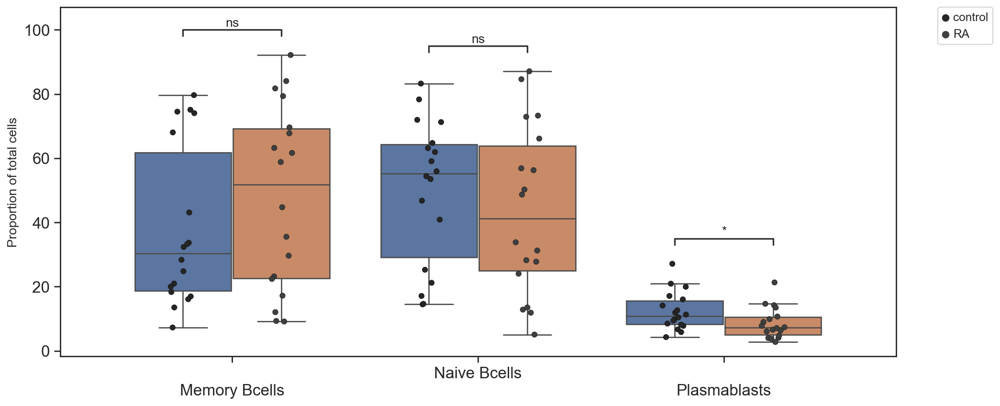

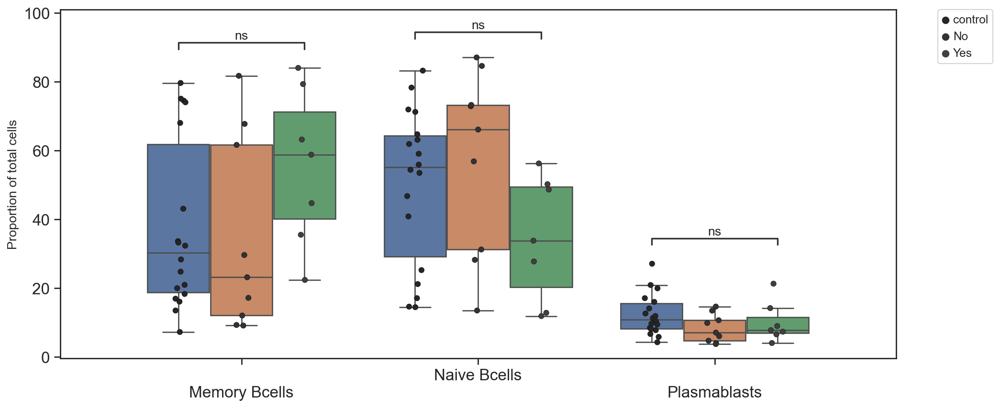

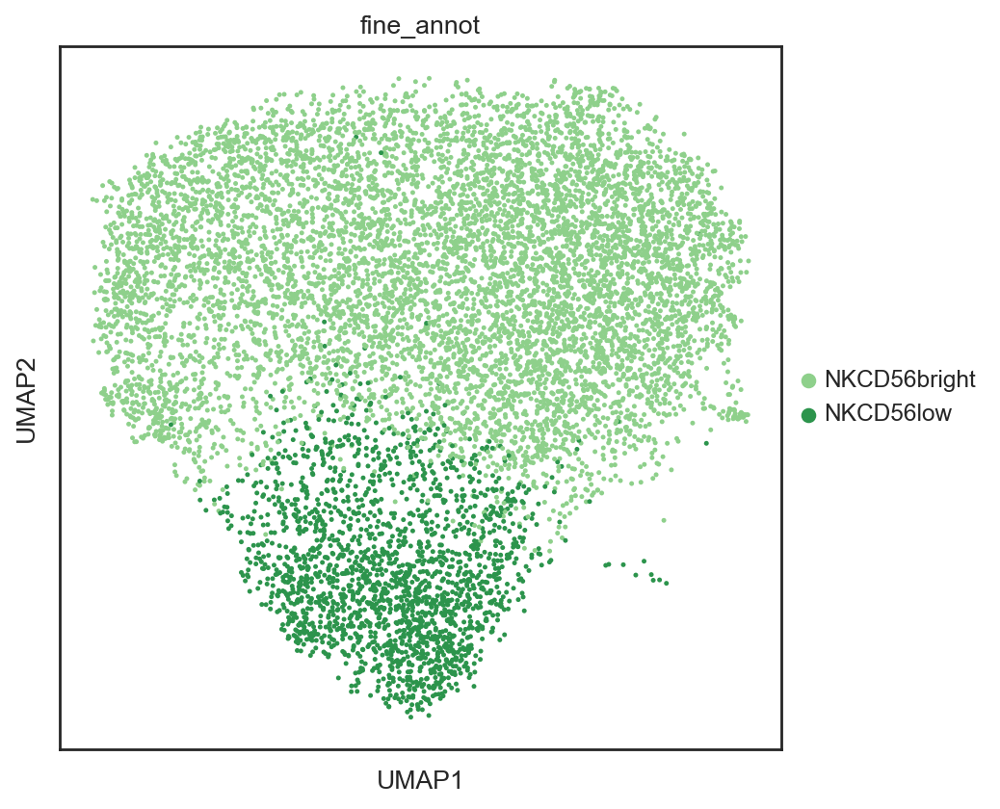

RA vs control (paired pvals): {'NKCD56bright': 0.3692169189453125, 'NKCD56low': 0.3692169189453125}
RA disease activity vs control (paired pvals): {'NKCD56bright': 0.15625, 'NKCD56low': 0.15625}
RA no disease activity vs control (paired pvals): {'NKCD56bright': 0.734375, 'NKCD56low': 0.734375}


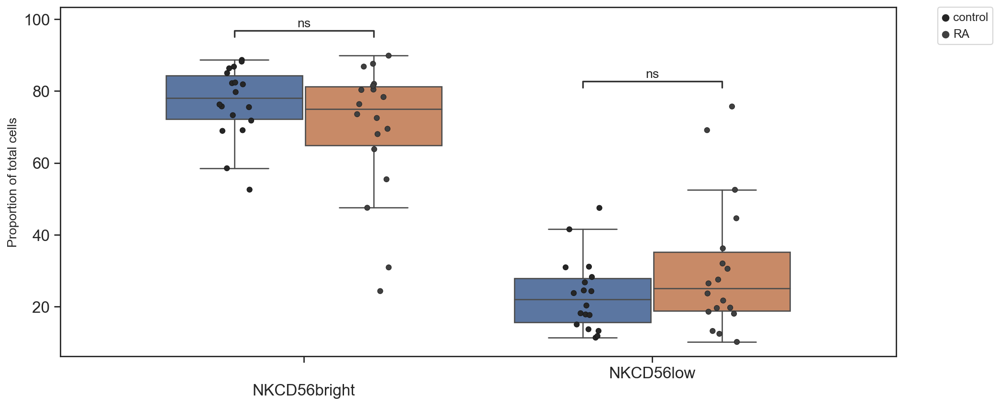

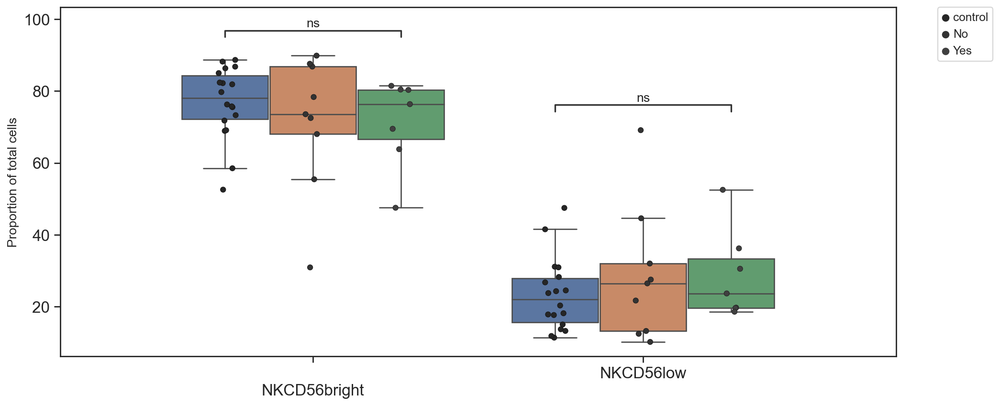

In [4]:
### FOR RAW DATA EXTRACTION
all_compiled_DAS = pd.DataFrame()
all_compiled_RA_control = pd.DataFrame()

########## Subset UMAPs and top genes
### params
cells=["CD8Tcells", "CD4Tcells", "Monocytes", "Bcells", "NKcells"]
final_annot = "fine_annot"
rank_key = "fine_annotation_rank"
plt.rcParams["figure.figsize"] = (4,4)

### plotting
for subset in cells:
    adata_sub  = sc.read("./dataOutput/subset_adata/" + subset +"_clustered.h5ad")
    sc.pl.umap(adata_sub, color=[final_annot], wspace=0.35, size=20, save="Figure3A_%s_fine_annot.pdf"%subset)
    
    # remove control 7 from batches 1 & 2
    adata_plot=adata_sub[~(adata_sub.obs["Sample"].str.contains("Control07") & adata_sub.obs["batch"].str.contains("1|2")),:]
    
    ### RA vs control
    groupby = "dx"
    # Density plot
    #sc.tl.embedding_density(adata_sub, basis='umap', groupby=groupby)
    #sc.pl.embedding_density(adata_sub, basis='umap', key="umap_density_%s"%groupby, 
    #                        group=["control", "RA"], save="Figure3A_%s.pdf"%subset)
    
    # Unpaired proportion analysis (activity vs no activity vs control)
    cell_subset_df = compositionalAnalysis(adata_sub, hue_groups=["control", "RA"], corr=None, 
                                           filename= "./figures/Figure3B_%s_proportion_RAvsControl.pdf"%subset, hue=groupby, 
                                           subset_col=final_annot, sample_col="Sample", single_pair=True, 
                                           return_df=True,
                          height=6, width=14, min_cells=0, density=False, stats_test=scipy.stats.mannwhitneyu)
    
    # Paired testing statistics
    cell_subset_df["pair_index_CW"] = cell_subset_df["Sample"].map(dict(zip(adata_sub.obs["Sample"], adata_sub.obs["pair_index_CW"])))
    pvals = pairedTestByCellType(cell_subset_df, subset_col=final_annot, groupby=groupby, 
                         groupA="control", groupB="RA",  pair_index="pair_index_CW", 
                         compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
    print("RA vs control (paired pvals): %s"%str(pvals))
    
    # Add mean values
    cell_subset_df_mean = cell_subset_df.groupby(["dx", "fine_annot"]).mean()
    cell_subset_df_mean["pair_index_CW"] = np.nan
    cell_subset_df_mean = cell_subset_df_mean.reset_index()
    cell_subset_df_mean["Sample"] = "Average (mean)"

    # Add standard deviation values
    cell_subset_df_std = cell_subset_df.groupby(["dx", "fine_annot"]).std()
    cell_subset_df_std["pair_index_CW"] = np.nan
    cell_subset_df_std = cell_subset_df_std.reset_index()
    cell_subset_df_std["Sample"] = "Average (std)"

    compiled = pd.concat([cell_subset_df, cell_subset_df_mean, cell_subset_df_std])
    compiled["pval"] = compiled["fine_annot"].map(pvals)
    all_compiled_RA_control = pd.concat([all_compiled_RA_control, compiled])
    
    ### Disease activity (Yes vs no vs control)
    groupby = "activity_python_binary_crp"
    # Density plot
    #sc.tl.embedding_density(adata_sub, basis='umap', groupby=groupby)
    #sc.pl.embedding_density(adata_sub, basis='umap', key="umap_density_%s"%groupby, 
    #                        group=["control", "No", "Yes"], save="Figure3A_%s.pdf"%subset)
    
    # Unpaired proportion analysis (activity vs no activity vs control)
    cell_subset_df = compositionalAnalysis(adata_sub, hue_groups=["control", "No", "Yes"], corr=None, 
                          hue=groupby, subset_col=final_annot, sample_col="Sample", single_pair=True, 
                          height=6, width=14, min_cells=0, density=False, stats_test=scipy.stats.kruskal,
                          filename= "./figures/Figure3B_%s_proportion_RAActivity.pdf"%subset)
    
    # Add mean values
    cell_subset_df_mean = cell_subset_df.groupby(["activity_python_binary_crp", "fine_annot"]).mean()
    cell_subset_df_mean["pair_index_CW"] = np.nan
    cell_subset_df_mean = cell_subset_df_mean.reset_index()
    cell_subset_df_mean["Sample"] = "Average (mean)"
    
    # Add standard deviation values
    cell_subset_df_std = cell_subset_df.groupby(["activity_python_binary_crp", "fine_annot"]).std()
    cell_subset_df_std["pair_index_CW"] = np.nan
    cell_subset_df_std = cell_subset_df_std.reset_index()
    cell_subset_df_std["Sample"] = "Average (std)"
    
    # Paired testing statistics for RA DAS vs control
    cell_subset_df["pair_index_CW"] = cell_subset_df["Sample"].map(dict(zip(adata_sub.obs["Sample"], adata_sub.obs["pair_index_CW"])))
    pvals_DAS_yes = pairedTestByCellType(cell_subset_df, subset_col=final_annot, groupby=groupby, 
                         groupA="control", groupB="Yes",  pair_index="pair_index_CW", 
                         compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
    print("RA disease activity vs control (paired pvals): %s"%str(pvals_DAS_yes))
   
    # Paired testing statistics for RA no disease activity vs control
    pvals_DAS_no = pairedTestByCellType(cell_subset_df, subset_col=final_annot, groupby=groupby, 
                         groupA="control", groupB="No",  pair_index="pair_index_CW", 
                         compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
    print("RA no disease activity vs control (paired pvals): %s"%str(pvals_DAS_no))
    
    # Add pvals
    compiled = pd.concat([cell_subset_df, cell_subset_df_mean, cell_subset_df_std])
    compiled["disease_activity_vs_control_pvals"] = compiled["fine_annot"].map(pvals)
    compiled["no_disease_activity_vs_control_pvals"] = compiled["fine_annot"].map(pvals_DAS_no)
    
    all_compiled_DAS = pd.concat([all_compiled_DAS, compiled])
    
# Save values
all_compiled_RA_control.columns = ["Sample", "Fine annotation", "Cell count",
                            "Total cell count for subset", "Proportion", "Group", "Sample ID", "Pair index", "p-value"]
all_compiled_RA_control.to_csv("./figures/RawFigureData/FigureS5C_raw_RA_control_subset_prop.csv")


# Save values
all_compiled_DAS.columns = ["Sample", "Fine annotation", "Cell count",
                            "Total cell count for subset", "Proportion", "Group", "Sample ID", "Pair index",
                           "Disease activity vs control p-values", "No disease activity vs control p-values",]
all_compiled_DAS.to_csv("./figures/RawFigureData/Figure5C_raw_DAS_subset_prop.csv")

    
########## Subset UMAPs and top genes
### params    



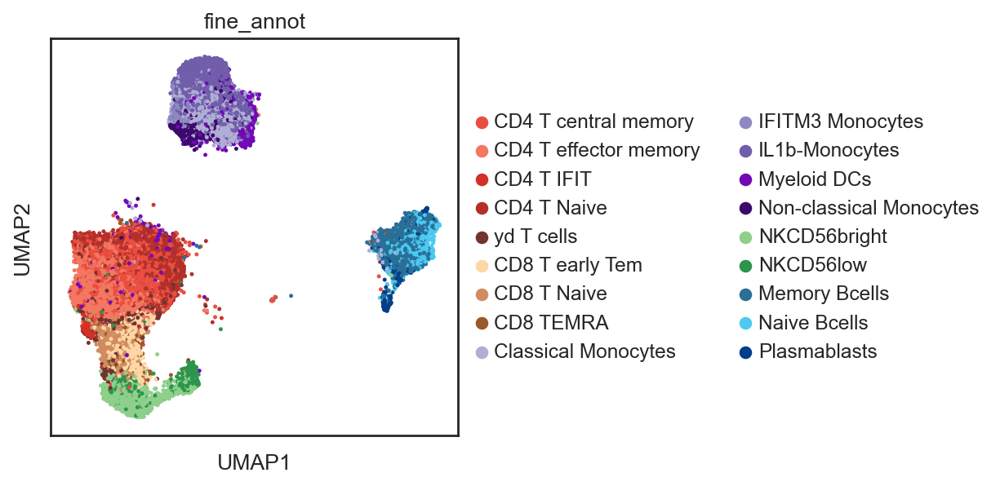

computing density on 'umap'


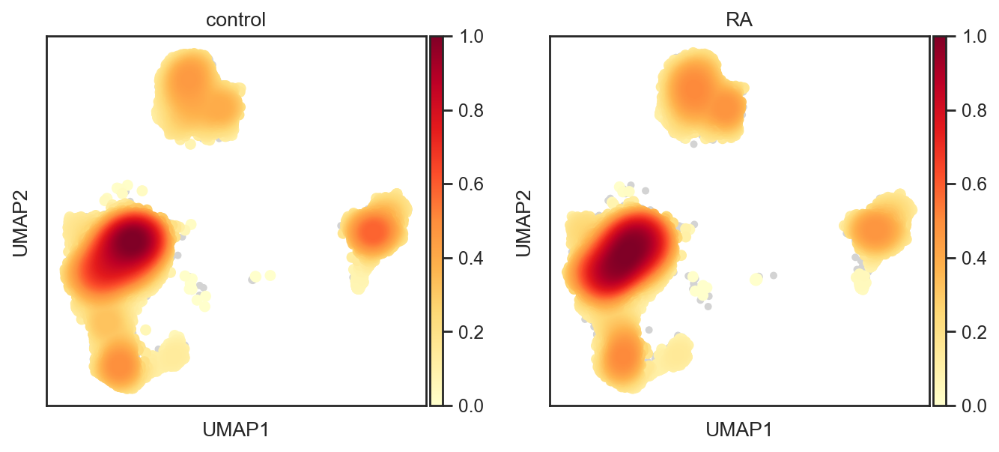

RA vs control (paired pvals): {'CD4 T central memory': 0.28372955322265625, 'CD4 T effector memory': 0.8650436401367188, 'CD4 T IFIT': 0.981116590883351, 'CD4 T Naive': 0.6094589233398438, 'yd T cells': 0.550872802734375, 'CD8 T early Tem': 0.49507904052734375, 'CD8 T Naive': 0.522613525390625, 'CD8 TEMRA': 0.6094589233398438, 'Classical Monocytes': 0.34654998779296875, 'IFITM3 Monocytes': 0.4631068149666542, 'IL1b-Monocytes': 0.6705245971679688, 'Myeloid DCs': 0.44229888916015625, 'Non-classical Monocytes': 0.08142852783203125, 'NKCD56bright': 0.32472991943359375, 'NKCD56low': 0.6396942138671875, 'Memory Bcells': 0.522613525390625, 'Naive Bcells': 0.44229888916015625, 'Plasmablasts': 0.00400543212890625}
computing density on 'umap'


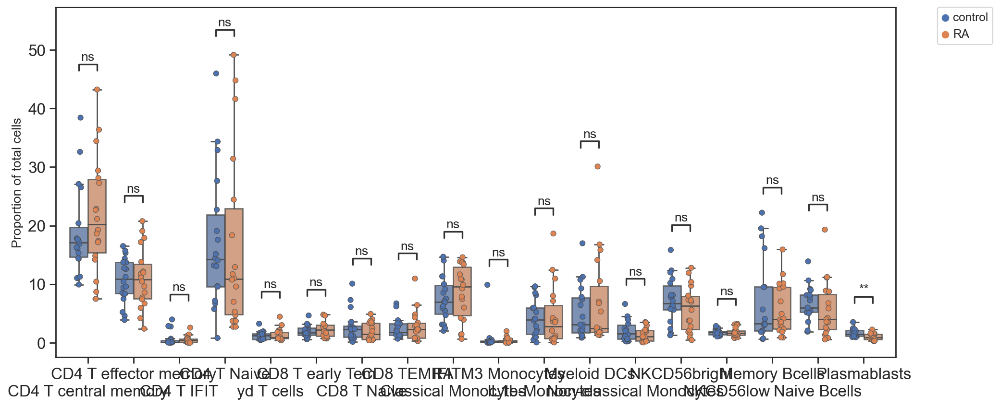

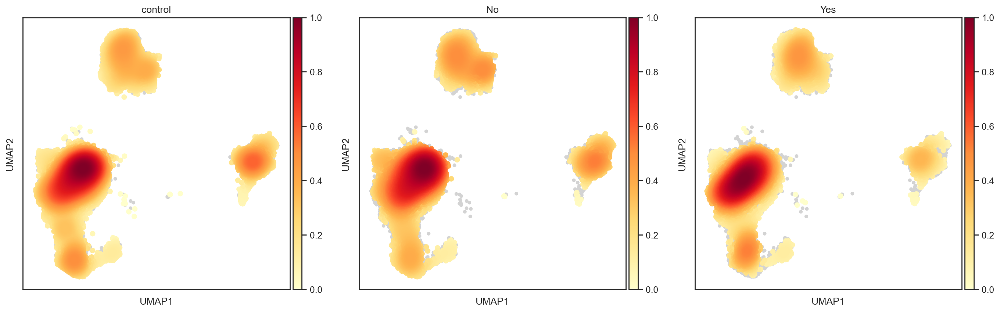

RA disease activity vs control (paired pvals): {'CD4 T central memory': 0.109375, 'CD4 T effector memory': 0.8125, 'CD4 T IFIT': 0.46875, 'CD4 T Naive': 0.46875, 'yd T cells': 0.9375, 'CD8 T early Tem': 1.0, 'CD8 T Naive': 0.9375, 'CD8 TEMRA': 0.46875, 'Classical Monocytes': 0.9375, 'IFITM3 Monocytes': 0.015625, 'IL1b-Monocytes': 0.8125, 'Myeloid DCs': 0.296875, 'Non-classical Monocytes': 0.21875, 'NKCD56bright': 0.296875, 'NKCD56low': 0.9375, 'Memory Bcells': 0.6875, 'Naive Bcells': 0.046875, 'Plasmablasts': 0.046875}
RA no disease activity vs control (paired pvals): {'CD4 T central memory': 0.65234375, 'CD4 T effector memory': 0.5703125, 'CD4 T IFIT': 0.2626182904425206, 'CD4 T Naive': 0.91015625, 'yd T cells': 0.42578125, 'CD8 T early Tem': 0.30078125, 'CD8 T Naive': 0.91015625, 'CD8 TEMRA': 0.8203125, 'Classical Monocytes': 0.09765625, 'IFITM3 Monocytes': 0.09289194088370531, 'IL1b-Monocytes': 0.91015625, 'Myeloid DCs': 1.0, 'Non-classical Monocytes': 0.91015625, 'NKCD56bright': 0.

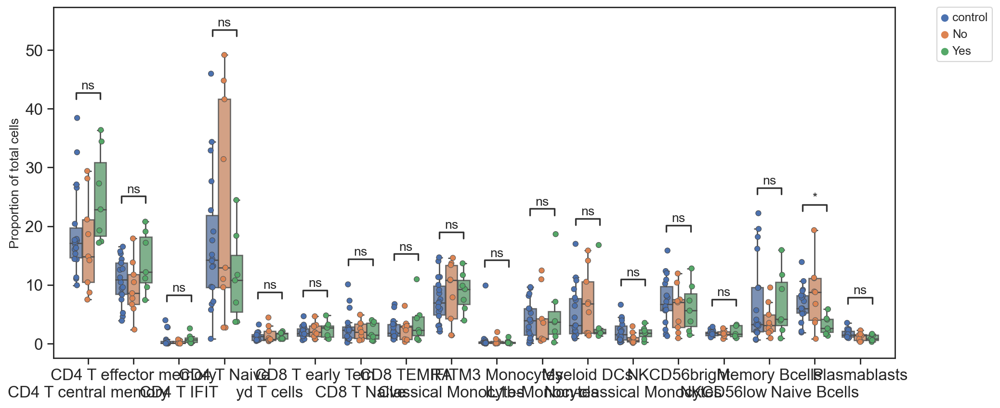

In [9]:
########## Subset UMAPs and top genes
### params
cells=["CD8Tcells", "CD4Tcells", "Monocytes", "Bcells", "NKcells"]
final_annot = "fine_annot"
rank_key = "fine_annotation_rank"
plt.rcParams["figure.figsize"] = (4,4)

### plotting
adata_sub  = sc.read("./dataOutput/adata/final.h5ad")
sc.pl.umap(adata_sub, color=[final_annot], wspace=0.35, size=20, save="Figure3A_%s_fine_annot.pdf"%subset)
    
# remove control 7 from batches 1 & 2
adata_plot=adata_sub[~(adata_sub.obs["Sample"].str.contains("Control07") & adata_sub.obs["batch"].str.contains("1|2")),:]
    
### RA vs control
groupby = "dx"
# Density plot
sc.tl.embedding_density(adata_sub, basis='umap', groupby=groupby)
sc.pl.embedding_density(adata_sub, basis='umap', key="umap_density_%s"%groupby, 
                            group=["control", "RA"], save="Figure3A_%s.pdf"%subset)
    
# Unpaired proportion analysis (activity vs no activity vs control)
cell_subset_df = compositionalAnalysis(adata_sub, hue_groups=["control", "RA"], corr=None, 
                                       filename= "./figures/Figure3B_%s_proportion_RAvsControl.pdf"%subset, hue=groupby, 
                                       subset_col=final_annot, sample_col="Sample", single_pair=True, 
                      height=6, width=14, min_cells=0, density=False, stats_test=scipy.stats.mannwhitneyu)

# Paired testing statistics
cell_subset_df["pair_index_CW"] = cell_subset_df["Sample"].map(dict(zip(adata_sub.obs["Sample"], adata_sub.obs["pair_index_CW"])))
pvals = pairedTestByCellType(cell_subset_df, subset_col=final_annot, groupby=groupby, 
                     groupA="control", groupB="RA",  pair_index="pair_index_CW", 
                     compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
print("RA vs control (paired pvals): %s"%str(pvals))

### Disease activity (Yes vs no vs control)
groupby = "activity_python_binary_crp"
# Density plot
sc.tl.embedding_density(adata_sub, basis='umap', groupby=groupby)
sc.pl.embedding_density(adata_sub, basis='umap', key="umap_density_%s"%groupby, 
                        group=["control", "No", "Yes"], save="Figure3A_%s.pdf"%subset)

# Unpaired proportion analysis (activity vs no activity vs control)
cell_subset_df = compositionalAnalysis(adata_sub, hue_groups=["control", "No", "Yes"], corr=None, 
                      hue=groupby, subset_col=final_annot, sample_col="Sample", single_pair=True, 
                      height=6, width=14, min_cells=0, density=False, stats_test=scipy.stats.kruskal,
                      filename= "./figures/Figure3B_%s_proportion_RAActivity.pdf"%subset)

# Paired testing statistics
cell_subset_df["pair_index_CW"] = cell_subset_df["Sample"].map(dict(zip(adata_sub.obs["Sample"], adata_sub.obs["pair_index_CW"])))
pvals = pairedTestByCellType(cell_subset_df, subset_col=final_annot, groupby=groupby, 
                     groupA="control", groupB="Yes",  pair_index="pair_index_CW", 
                     compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
print("RA disease activity vs control (paired pvals): %s"%str(pvals))

pvals = pairedTestByCellType(cell_subset_df, subset_col=final_annot, groupby=groupby, 
                     groupA="control", groupB="No",  pair_index="pair_index_CW", 
                     compare_col="proportion", corr=None, stats_test=scipy.stats.wilcoxon) #ttest_rel
print("RA no disease activity vs control (paired pvals): %s"%str(pvals))



########## Subset UMAPs and top genes
### params    

CD4Tcells
computing density on 'umap'


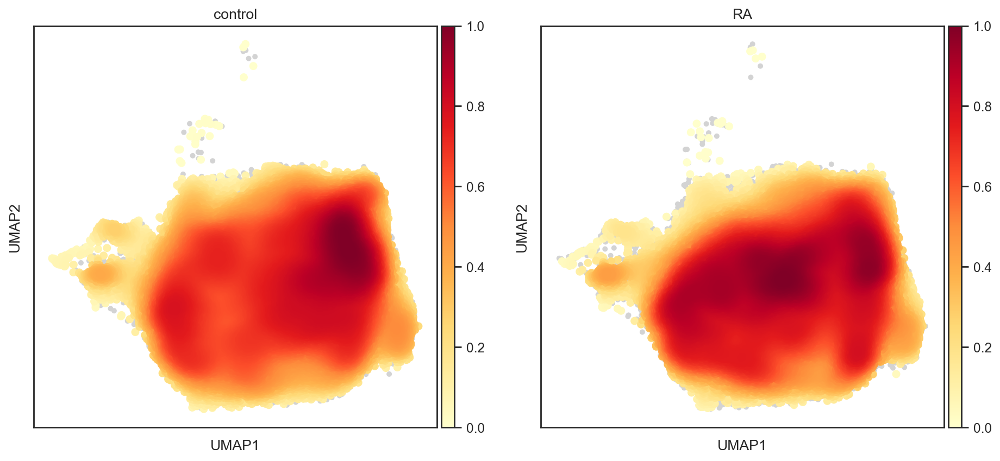

computing density on 'umap'


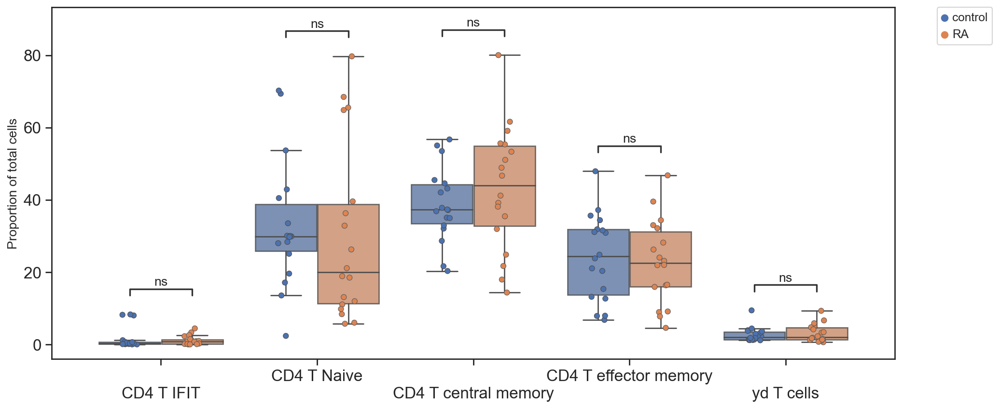

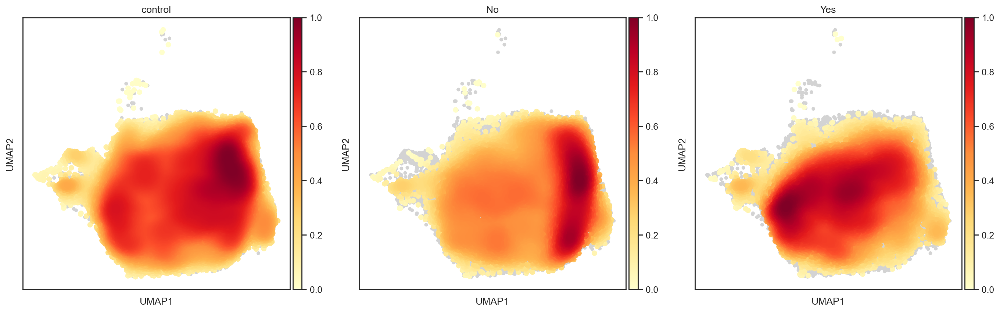

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CD4 T Naive_No v.s. CD4 T Naive_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.105e-01 U_stat=4.400e+01
CD4 T central memory_control v.s. CD4 T central memory_No: Mann-Whitney-Wilcoxon test two-sided, P_val=3.961e-01 U_stat=9.800e+01
CD4 T central memory_No v.s. CD4 T central memory_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=9.073e-02 U_stat=1.500e+01
CD4 T effector memory_control v.s. CD4 T effector memory_No: Mann-Whitney-Wilcoxon test two-sided, P_val=5.542e-01 U_stat=9.300e+01
CD4 T effector memory_No v.s. CD4 T effector memory_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.523e-01 U_stat=2.000e+01
yd T cells_control v.s. yd T cells_No: Mann-Whitney-Wilcoxon test two-sided, P_val=8.977e-01 U_stat=8.400e+01
yd T cells_No v.s. yd T cells_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=7.577e-01 U_stat=2.800e

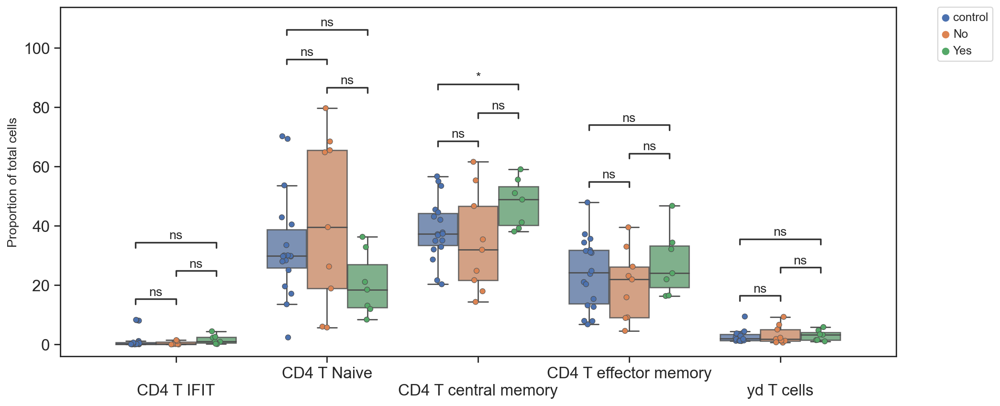

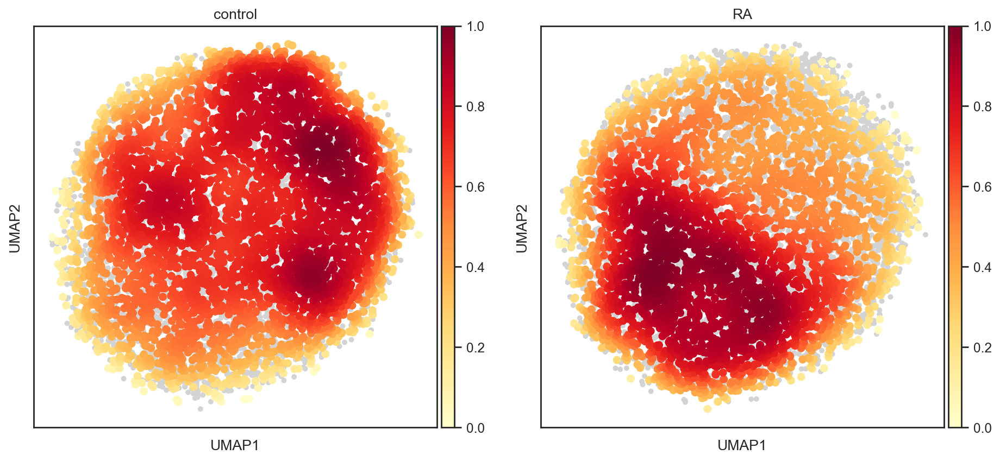

computing density on 'umap'


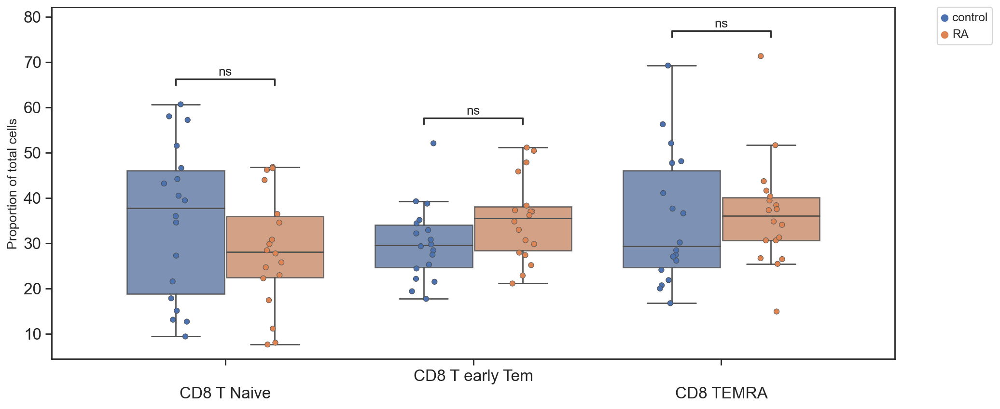

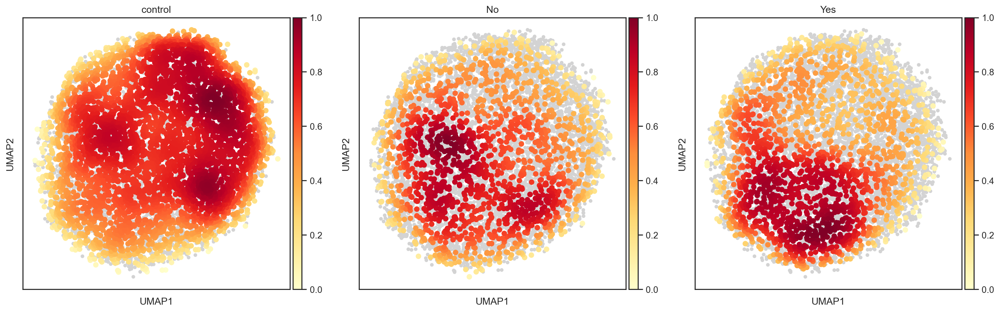

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CD8 T early Tem_No v.s. CD8 T early Tem_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=6.806e-01 U_stat=3.600e+01
CD8 TEMRA_control v.s. CD8 TEMRA_No: Mann-Whitney-Wilcoxon test two-sided, P_val=1.000e+00 U_stat=8.100e+01
CD8 TEMRA_No v.s. CD8 TEMRA_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.991e-01 U_stat=2.100e+01
CD8 T Naive_control v.s. CD8 T Naive_No: Mann-Whitney-Wilcoxon test two-sided, P_val=8.571e-01 U_stat=8.500e+01
CD8 T Naive_No v.s. CD8 T Naive_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=3.510e-01 U_stat=4.100e+01
CD8 T early Tem_control v.s. CD8 T early Tem_No: Mann-Whitney-Wilcoxon test two-sided, P_val=2.076e-01 U_stat=5.600e+01
CD8 TEMRA_control v.s. CD8 TEMRA_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=3.261e-01 U_stat=4.600e+01
CD8 T early Tem_control v.s. CD8 T early Tem_Yes: Mann-Whit

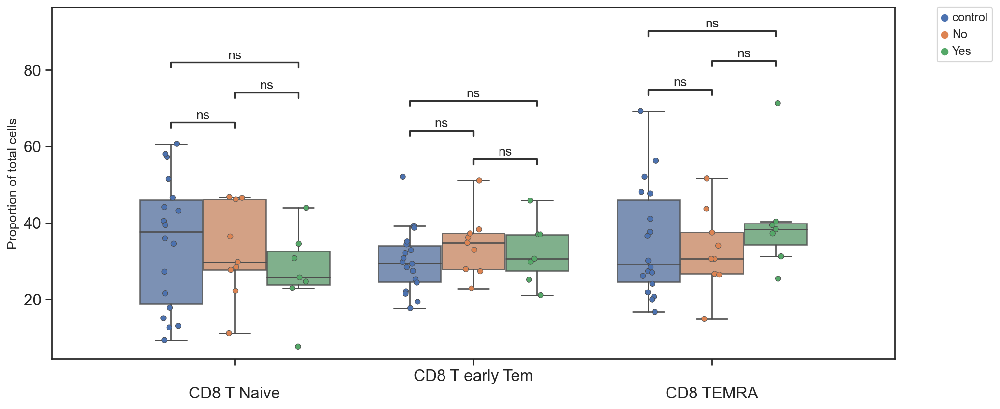

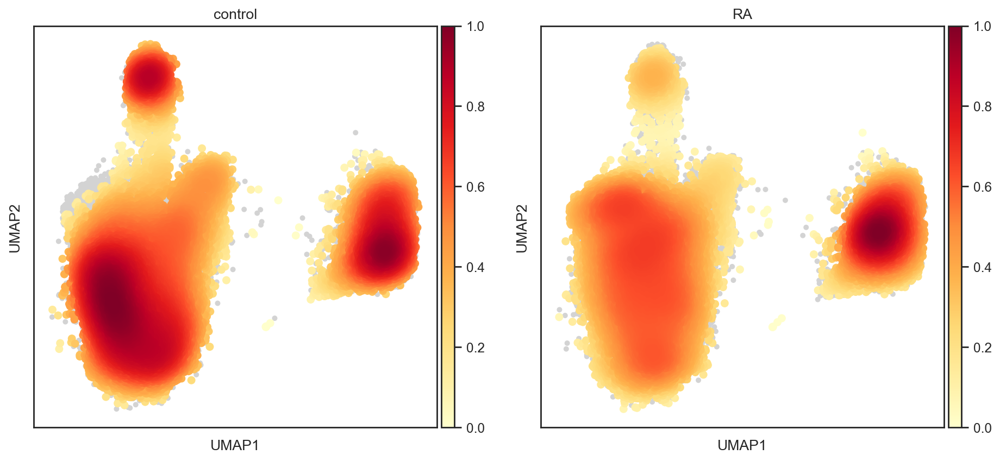

computing density on 'umap'


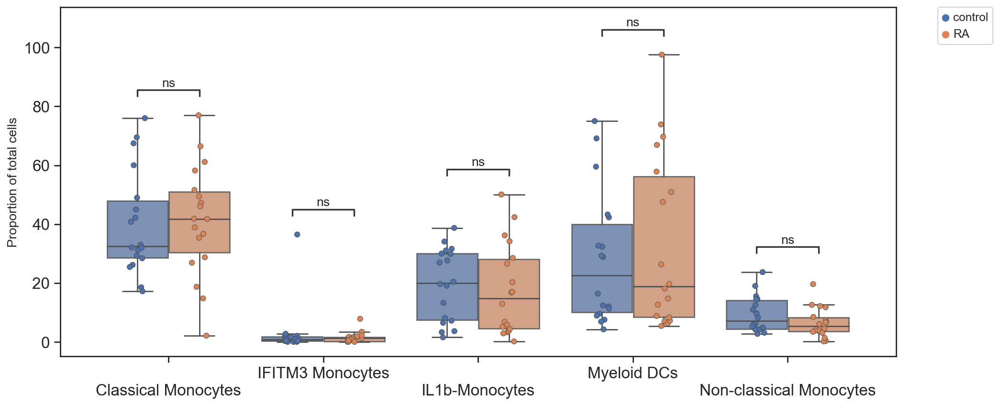

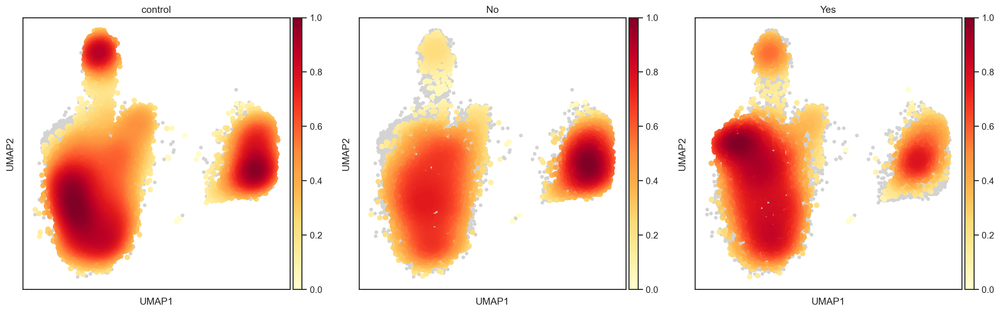

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

IFITM3 Monocytes_No v.s. IFITM3 Monocytes_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=6.336e-01 U_stat=3.650e+01
IL1b-Monocytes_control v.s. IL1b-Monocytes_No: Mann-Whitney-Wilcoxon test two-sided, P_val=3.413e-01 U_stat=1.000e+02
IL1b-Monocytes_No v.s. IL1b-Monocytes_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=4.698e-01 U_stat=2.400e+01
Myeloid DCs_control v.s. Myeloid DCs_No: Mann-Whitney-Wilcoxon test two-sided, P_val=3.413e-01 U_stat=6.200e+01
Myeloid DCs_No v.s. Myeloid DCs_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.523e-01 U_stat=4.300e+01
Non-classical Monocytes_control v.s. Non-classical Monocytes_No: Mann-Whitney-Wilcoxon test two-sided, P_val=1.456e-02 U_stat=1.290e+02
Non-classical Monocytes_No v.s. Non-classical Monocytes_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.290e-02 U_stat=1.000e+0

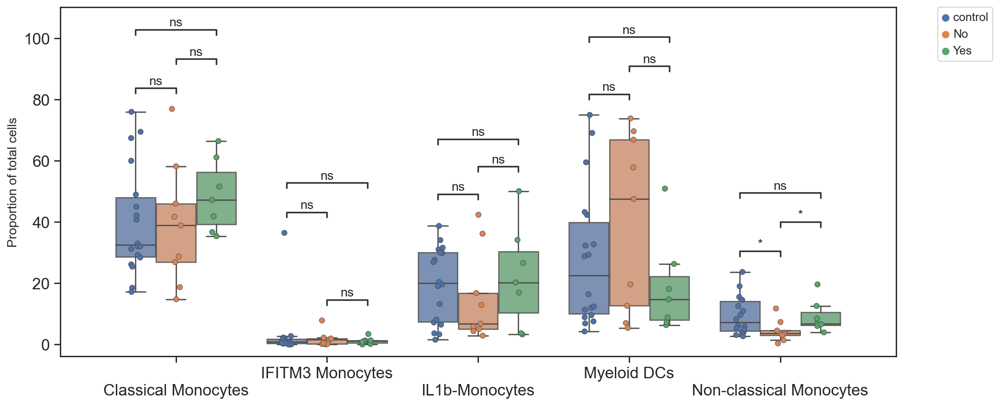

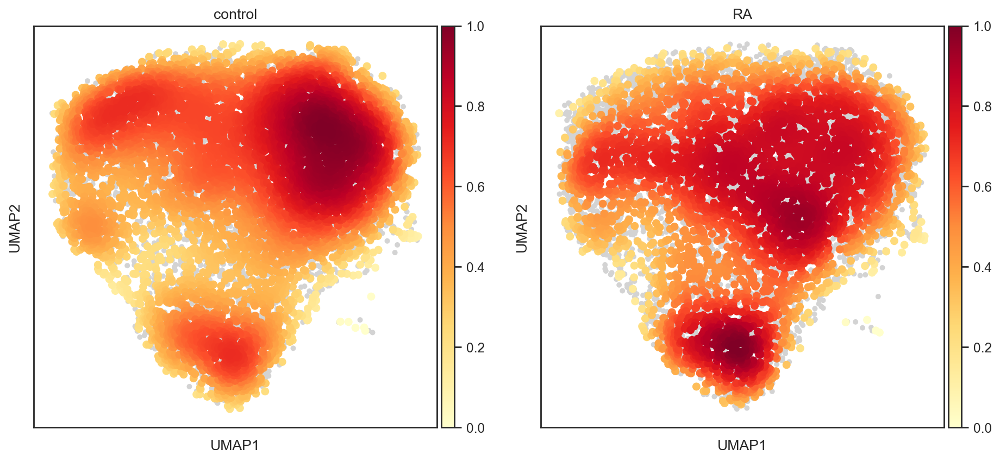

computing density on 'umap'


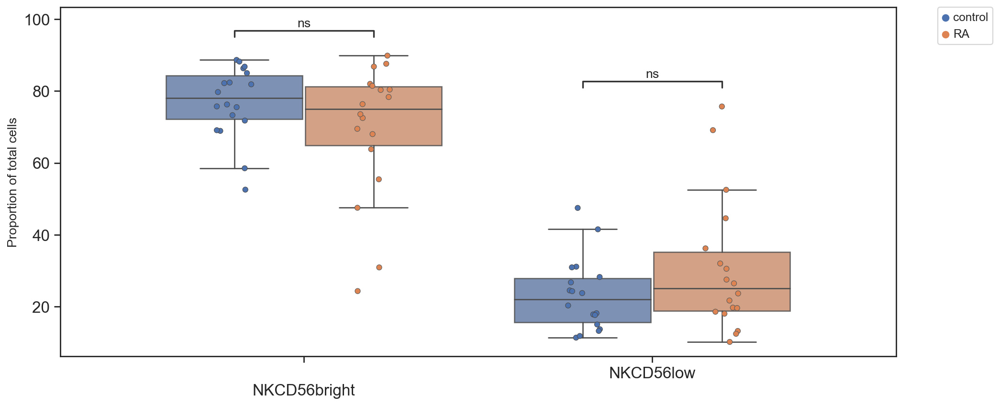

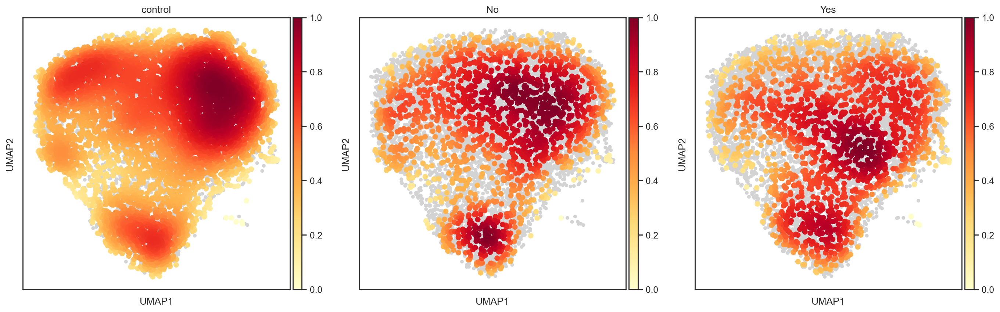

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

NKCD56low_No v.s. NKCD56low_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=8.371e-01 U_stat=2.900e+01
NKCD56bright_control v.s. NKCD56bright_No: Mann-Whitney-Wilcoxon test two-sided, P_val=6.997e-01 U_stat=8.900e+01
NKCD56bright_No v.s. NKCD56bright_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=8.371e-01 U_stat=3.400e+01
NKCD56low_control v.s. NKCD56low_No: Mann-Whitney-Wilcoxon test two-sided, P_val=6.997e-01 U_stat=7.300e+01
NKCD56low_control v.s. NKCD56low_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.971e-01 U_stat=4.500e+01
NKCD56bright_control v.s. NKCD56bright_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.971e-01 U_stat=8.100e+01
Bcells
computing density on 'umap'


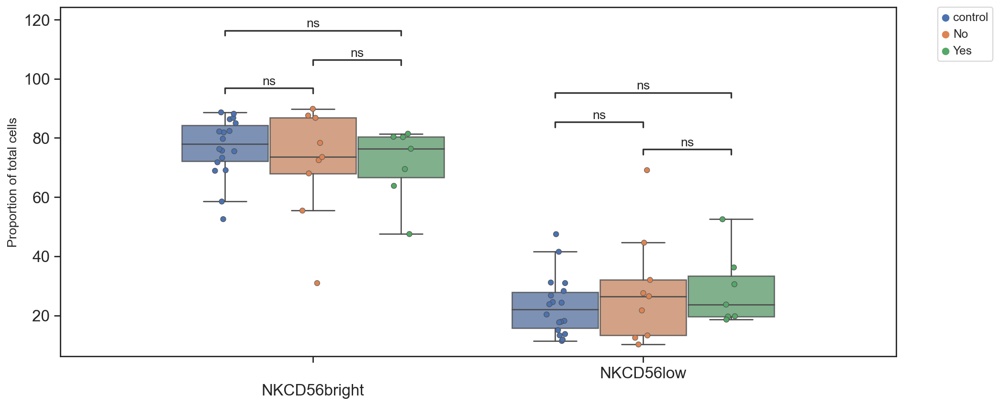

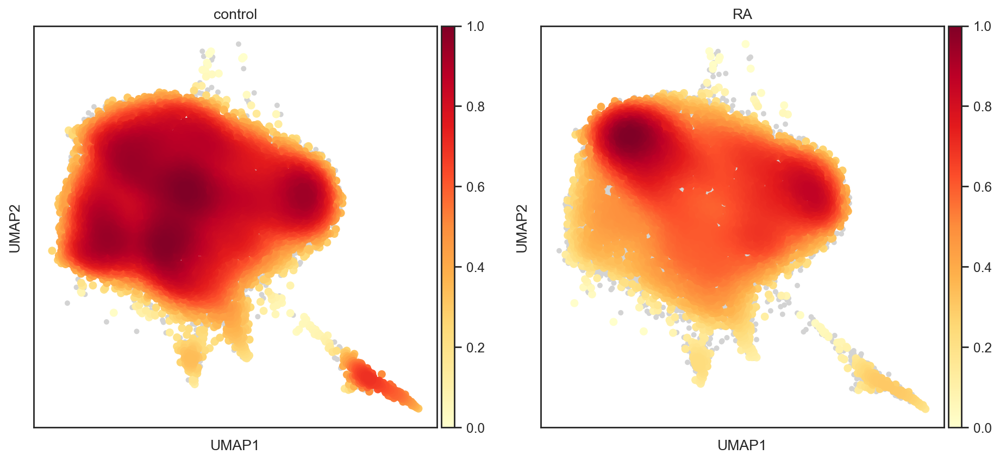

computing density on 'umap'


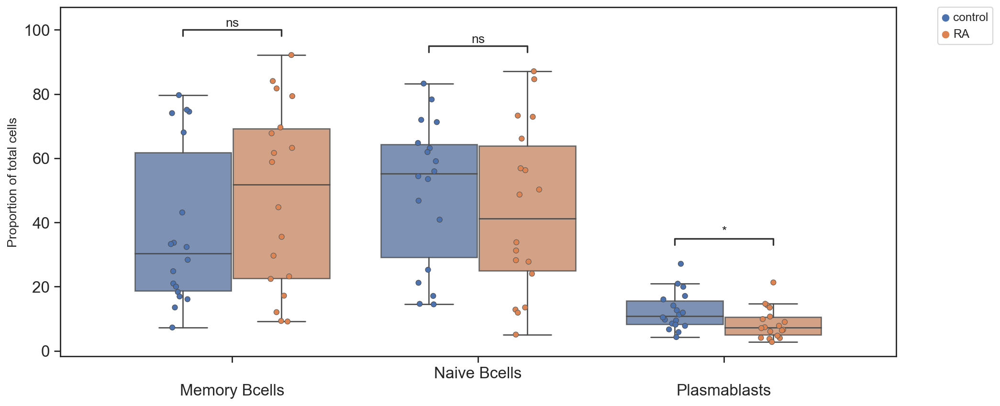

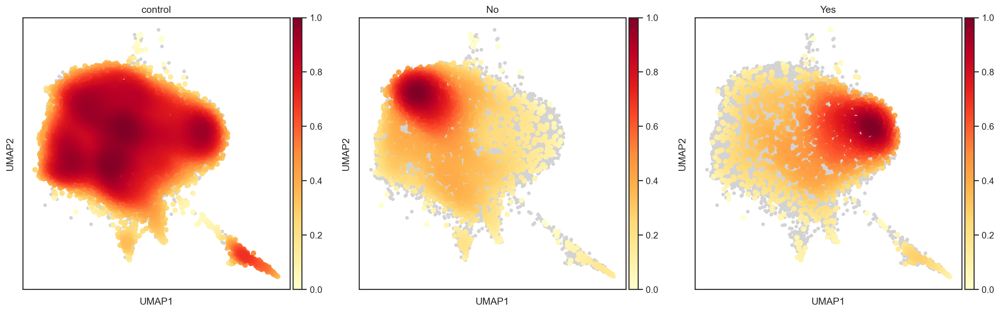

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Naive Bcells_No v.s. Naive Bcells_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=5.490e-02 U_stat=5.000e+01
Plasmablasts_control v.s. Plasmablasts_No: Mann-Whitney-Wilcoxon test two-sided, P_val=9.460e-02 U_stat=1.140e+02
Plasmablasts_No v.s. Plasmablasts_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=5.360e-01 U_stat=2.500e+01
Memory Bcells_control v.s. Memory Bcells_No: Mann-Whitney-Wilcoxon test two-sided, P_val=4.875e-01 U_stat=9.500e+01
Memory Bcells_No v.s. Memory Bcells_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=1.416e-01 U_stat=1.700e+01
Naive Bcells_control v.s. Naive Bcells_No: Mann-Whitney-Wilcoxon test two-sided, P_val=2.917e-01 U_stat=6.000e+01
Plasmablasts_control v.s. Plasmablasts_Yes: Mann-Whitney-Wilcoxon test two-sided, P_val=2.971e-01 U_stat=8.100e+01
Naive Bcells_control v.s. Naive Bcells_Yes: M

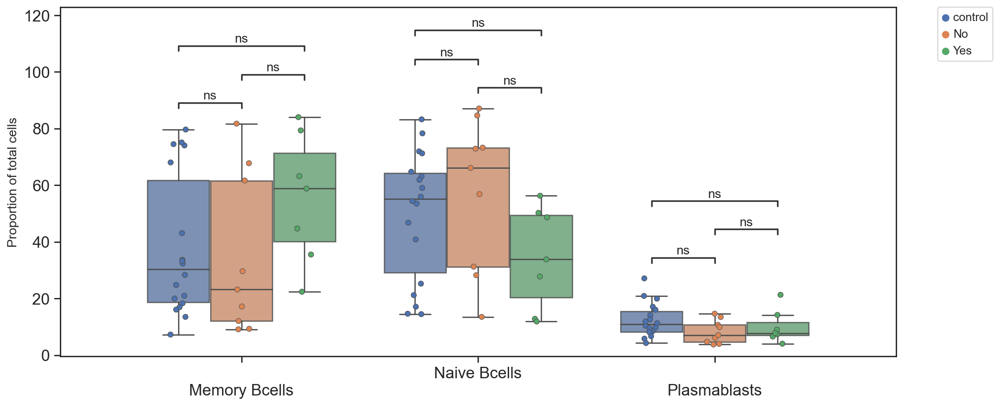

In [141]:
########## Unpaired analysis 

hue_groups_dx = ["control", "RA"] #, ["Positive", "Negative"] #["control", "No", "Yes"]
hue_dx = "dx" #"MY_MTX" #"dx" #"activity_python_binary"

hue_groups = ["control", "No", "Yes"] #, ["Positive", "Negative"] #["control", "No", "Yes"]
hue = "activity_python_binary_crp" #"MY_MTX" #"dx" #"activity_python_binary"

for subset in cells_dict:
    print(subset)
    adata_sub = sc.read_h5ad("./dataOutput/subset_adata/" + subset +"_clustered.h5ad")


    compositionalAnalysis(adata_sub, hue_groups=hue_groups_dx,single_pair = True,
                          hue=hue_dx, subset_col="fine_annot", 
                          height=6,width=14, min_cells=200, stats_test=scipy.stats.mannwhitneyu,#, #mannwhitneyu, 
                          corr=None, density=True, return_df=False) # #ttest_ind

    compositionalAnalysis(adata_sub,hue_groups=hue_groups, single_pair = False,
                          hue=hue, subset_col="fine_annot", stat_annot_test = "Mann-Whitney",
                          height=6,width=14, min_cells=200, stats_test=scipy.stats.kruskal, #, #mannwhitneyu, 
                          corr=None, density=True, return_df=False) # #ttest_ind



## Figure S6


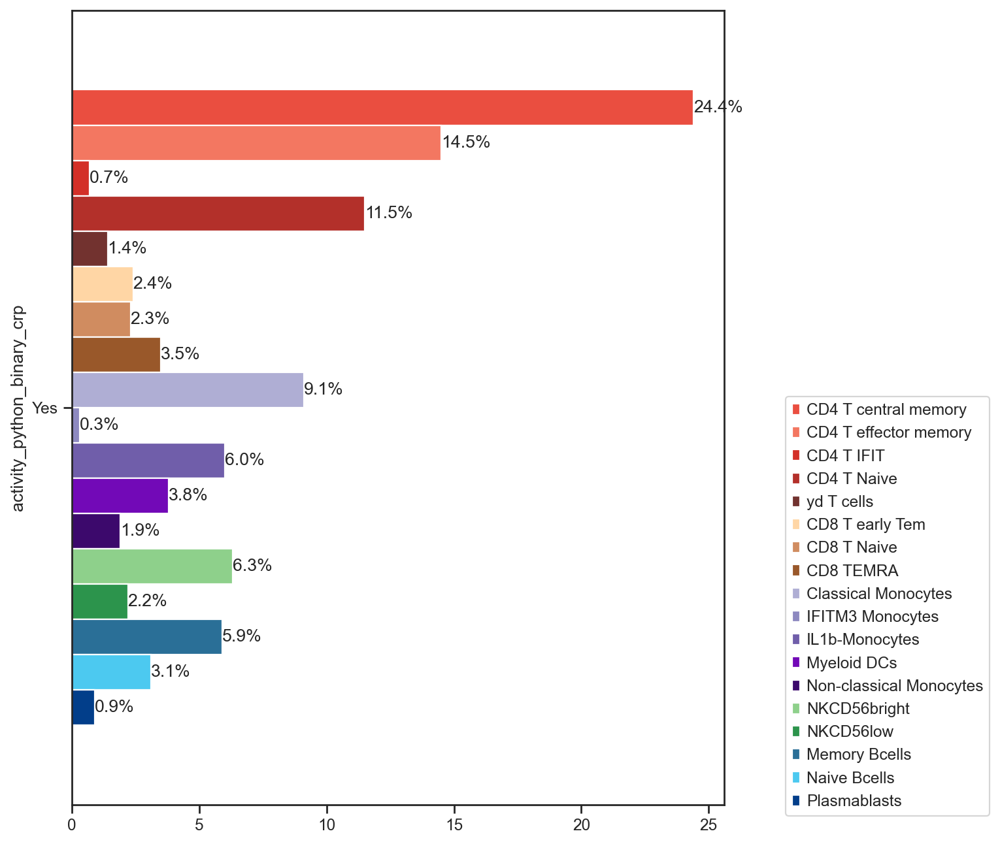

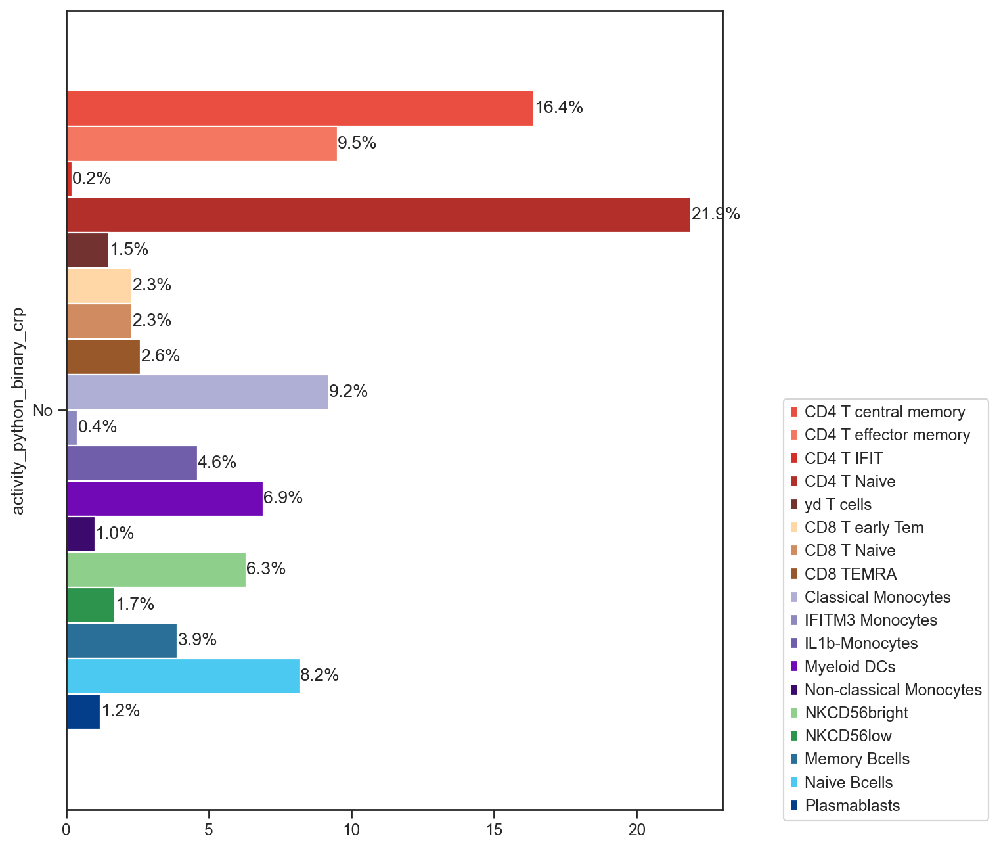

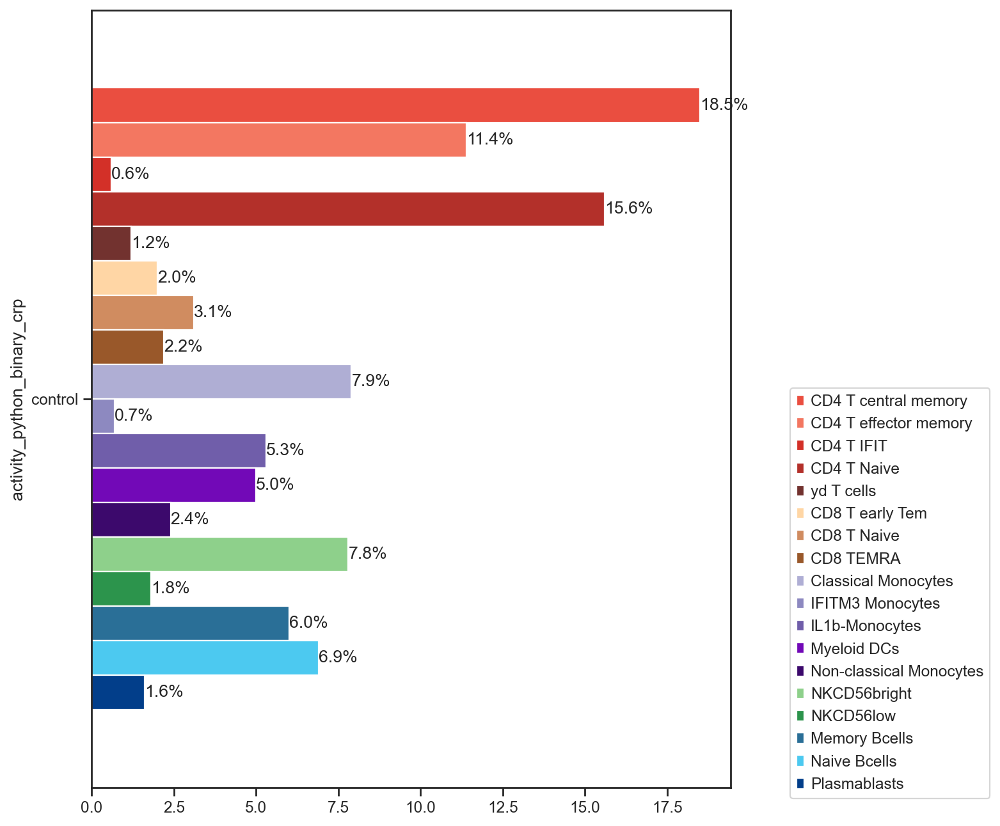

In [139]:
##### To do after the subset annotation
plt.rcParams['figure.figsize'] = [7, 5]

inputPath = './dataOutput/adata/final.h5ad'
comparison = 'activity_python_binary_crp'

adata_plot = sc.read(inputPath)

color_subset = ['#ea4e40','#f37761', '#d33028', '#b3302a', '#72322f',
                '#FFD6A5','#d08c60','#99582a',
                '#afaed4','#8d89c0','#705eaa', '#7209b7','#3c096c',
                '#8ed08b', '#2c944c',
                '#2a6f97','#4cc9f0','#023e8a','#0267c1',  '#A0C4FF']

### if comparison if disease activiy
adata_plot_Yes = adata_plot[(adata_plot.obs[comparison] == "Yes"),:]
adata_plot_No = adata_plot[(adata_plot.obs[comparison] == "No"),:]
adata_plot_control = adata_plot[(adata_plot.obs[comparison] == "control"),:]

tmp = pd.crosstab(adata_plot_Yes.obs[comparison],adata_plot_Yes.obs['fine_annot'], normalize='index')
tmp = round(tmp*100,1)
ax = tmp.plot(kind = "barh", width = 2,stacked=False, figsize=(8,10), color = color_subset)
ax.invert_yaxis()
ax.legend(loc='center', bbox_to_anchor=(1, 0., 0.5, 0.5))
for p in ax.containers:
    ax.bar_label(p, fmt='%.1f%%', label_type='edge')
plt.savefig('RA_proportion_activity_Yes.pdf')


tmp = pd.crosstab(adata_plot_No.obs[comparison],adata_plot_No.obs['fine_annot'], normalize='index')
tmp = round(tmp*100,1)
ax = tmp.plot(kind = "barh", width = 2,stacked=False, figsize=(8,10), color = color_subset)
ax.invert_yaxis()
ax.legend(loc='center', bbox_to_anchor=(1, 0., 0.5, 0.5))
for p in ax.containers:
    ax.bar_label(p, fmt='%.1f%%', label_type='edge')
plt.savefig('RA_proportion_activity_No.pdf')


tmp = pd.crosstab(adata_plot_control.obs[comparison],adata_plot_control.obs['fine_annot'], normalize='index')
tmp = round(tmp*100,1)
ax = tmp.plot(kind = "barh", width = 2,stacked=False, figsize=(8,10), color = color_subset)
ax.invert_yaxis()
ax.legend(loc='center', bbox_to_anchor=(1, 0., 0.5, 0.5))
for p in ax.containers:
    ax.bar_label(p, fmt='%.1f%%', label_type='edge')
plt.savefig('control_proportion_activity_control.pdf')



"import matplotlib.pyplot as plt\nimport numpy as np\n\n# your input data:\nbefores = np.random.rand(10)\nafters = np.random.rand(10)\n\n# plotting the points\nplt.scatter(np.zeros(len(befores)), befores)\nplt.scatter(np.ones(len(afters)), afters)\n\n# plotting the lines\nfor i in range(len(befores)):\n    plt.plot( [0,1], [befores[i], afters[i]], c='k')\n\nplt.xticks([0,1], ['before', 'after'])\n\nplt.show()"

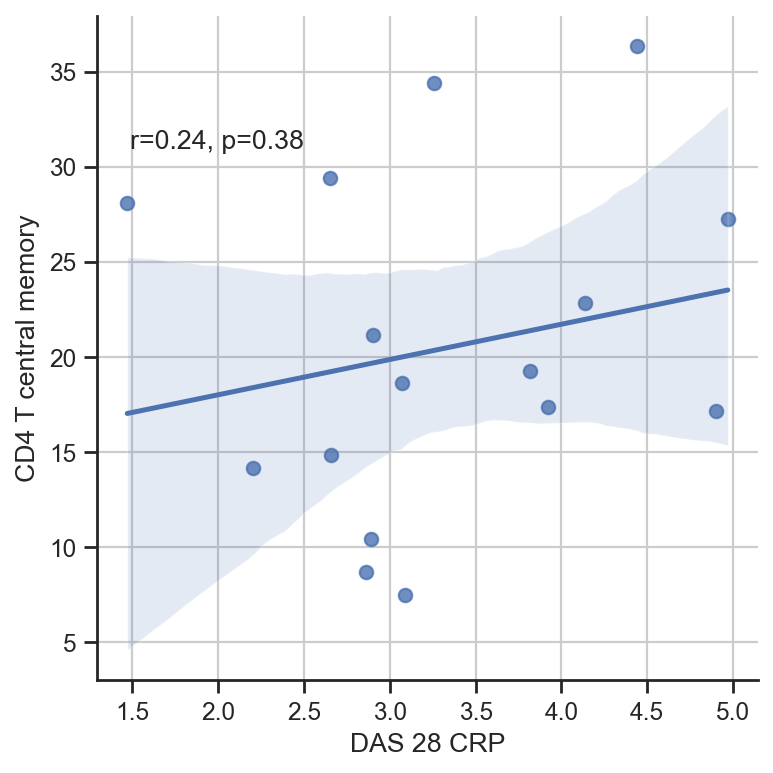

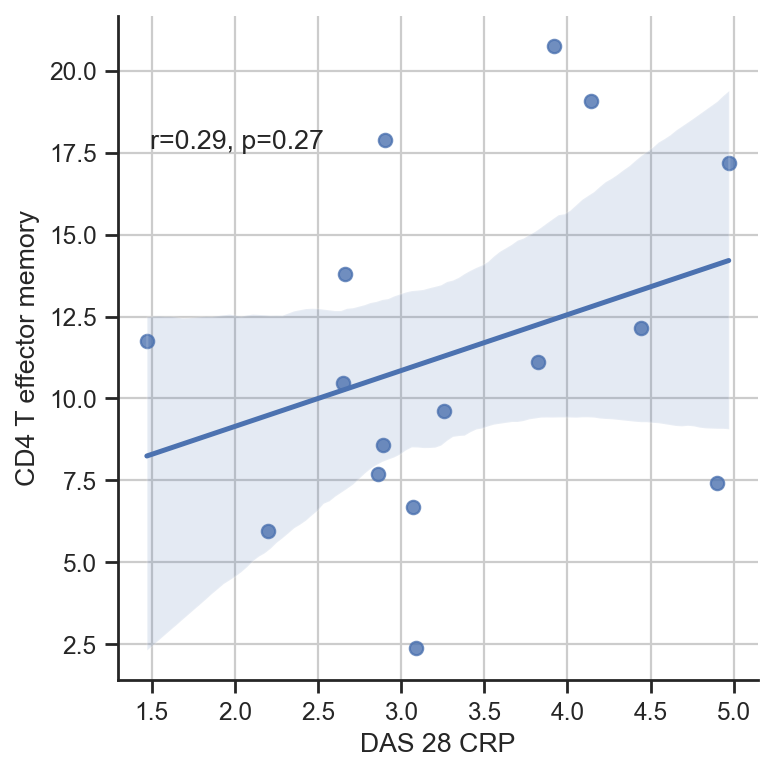

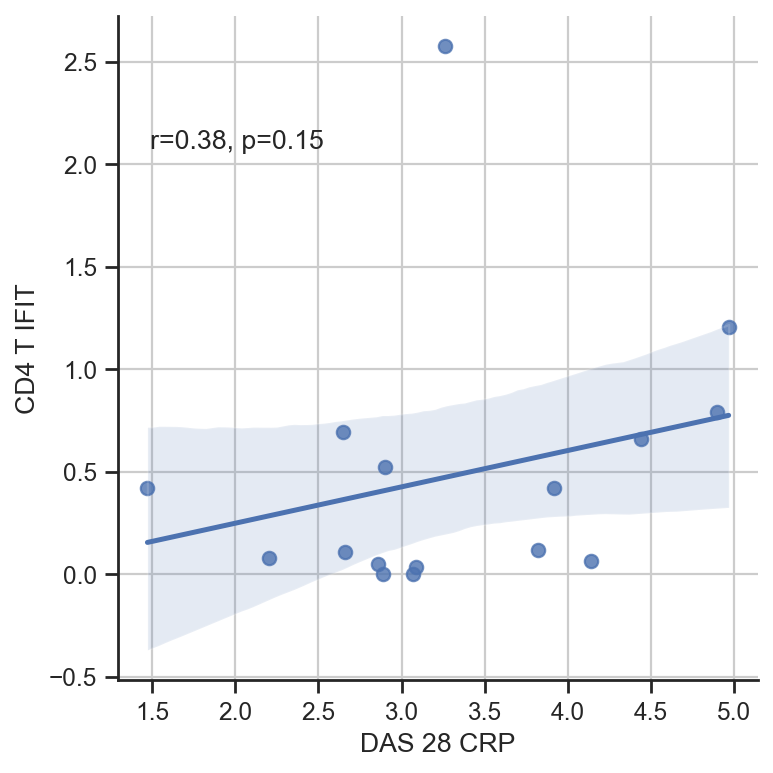

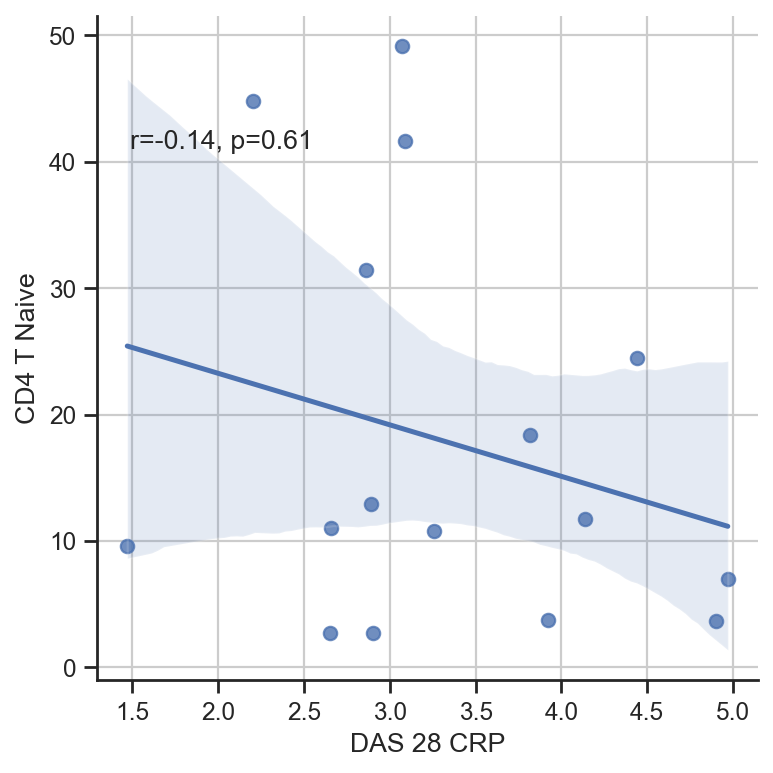

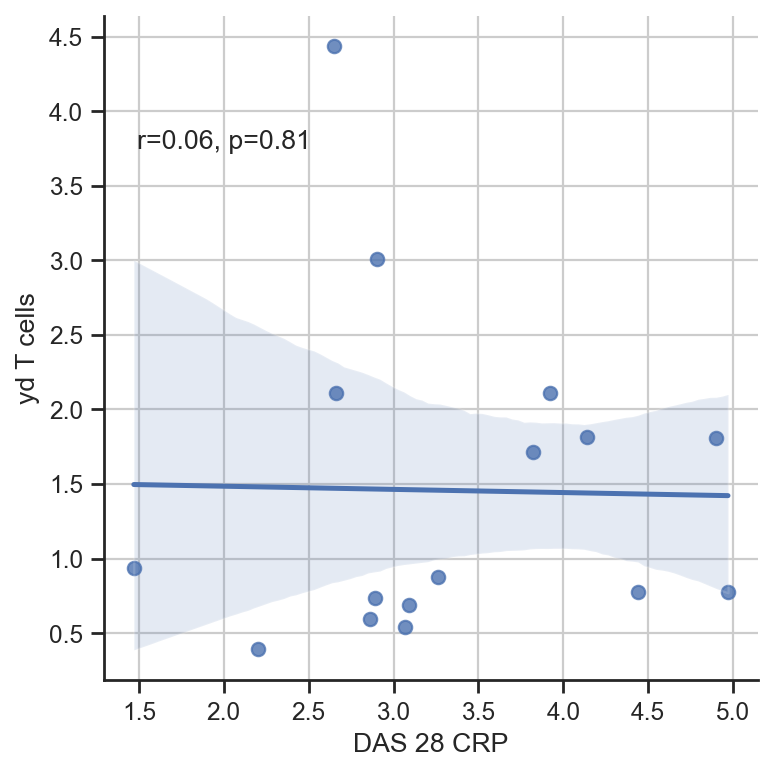

...

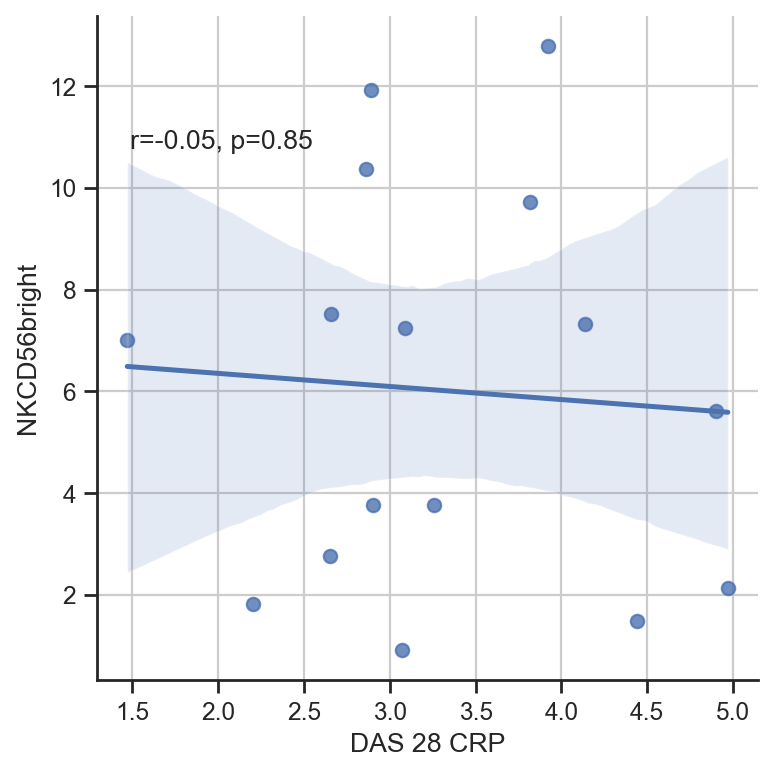

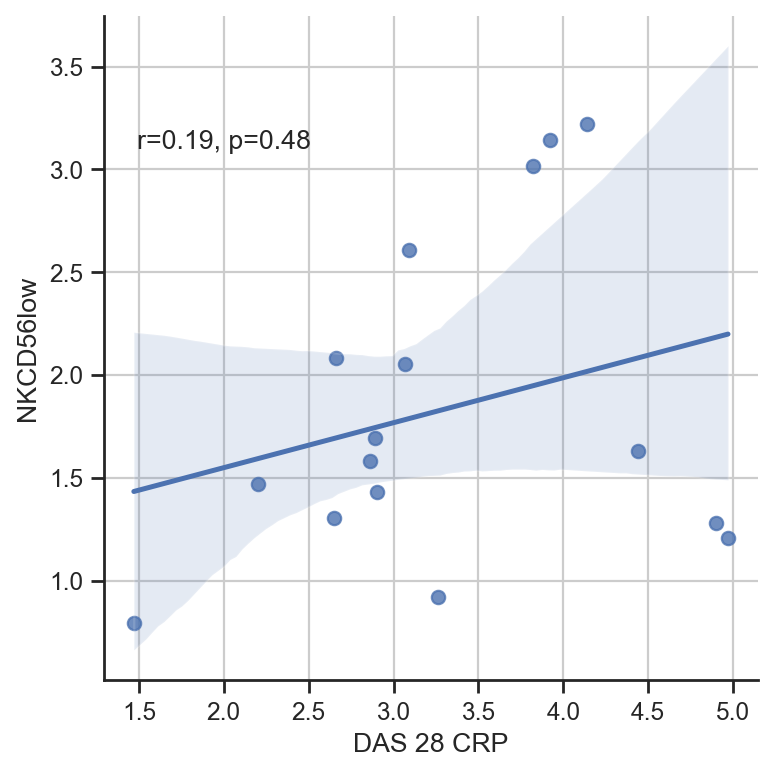

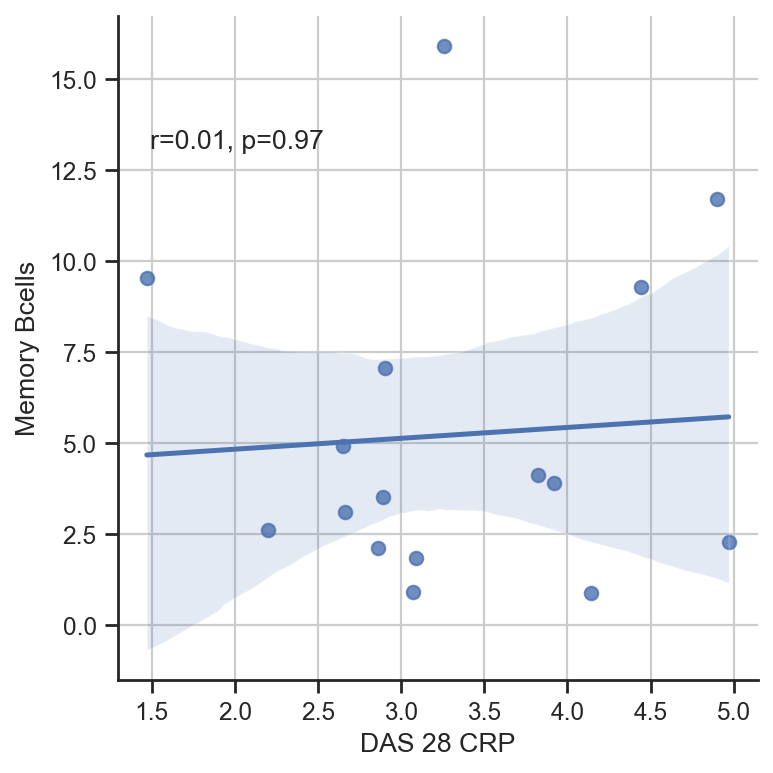

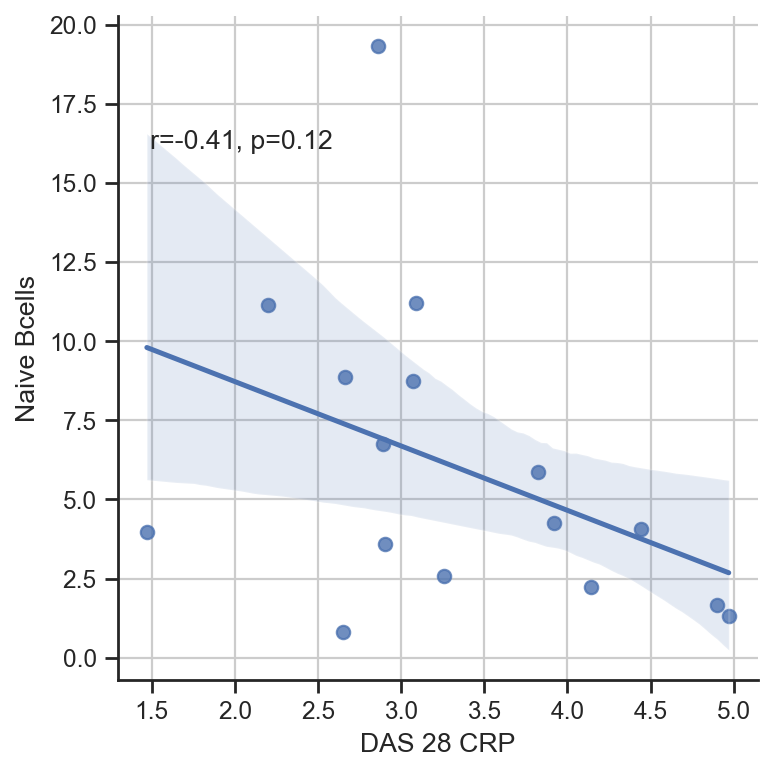

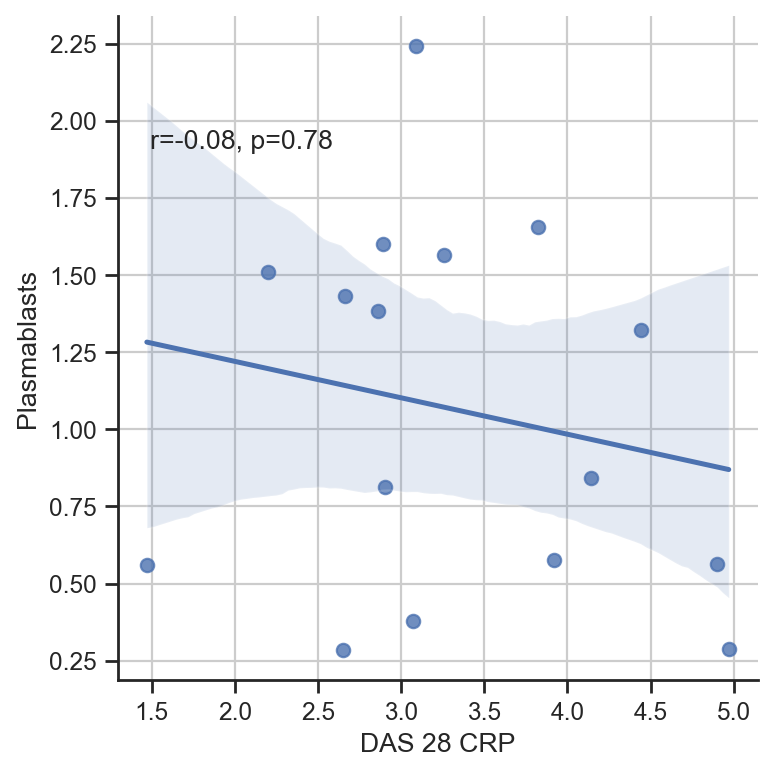

In [20]:
########## TODO: Correlation cell proportions vs DAS28
### Subset analysis

inputPath = './dataOutput/adata/final.h5ad'
plt.rcParams['figure.figsize'] = [5, 5]
annot = "fine_annot" #fine_annot

adata =sc.read(inputPath)

cell_proportions_temp = getCellSubsetProportions(adata, cluster_col=annot, sample_col="Sample")

### Correlation analysis
cor_temp = adata.obs[["Sample","MY_das28crp4", "activity_python_binary_crp", "rough_annot"]]
cor_temp = cor_temp.reset_index(drop = True)
cor_temp = cor_temp.drop_duplicates(subset = ['Sample'])

pd.set_option('display.max_rows', 50)
cor_temp[cor_temp.Sample.duplicated(keep = False)].sort_values(by = 'Sample')

cell_proportions = cell_proportions_temp.merge(cor_temp, on = 'Sample', how = 'left' )

cell_proportions = cell_proportions[cell_proportions['activity_python_binary_crp'] != "NA"]
cell_proportions['MY_das28crp4'] = cell_proportions['MY_das28crp4'].fillna(0)
cell_proportions = cell_proportions[cell_proportions['activity_python_binary_crp'] != "control"]

values_dict={}
all_plot_df = pd.DataFrame()

for x in (cell_proportions[annot].unique()): #pearson
    plot_df = cell_proportions[cell_proportions[annot] == x]
    
    # Spearman
    r = scipy.stats.spearmanr(plot_df["MY_das28crp4"], plot_df['proportion'])[0]
    p = scipy.stats.spearmanr(plot_df["MY_das28crp4"], plot_df['proportion'] )[1]

    values_dict[x] = {"r":r, "p":p}
    plot_df["r"] = r
    plot_df["p"] = p
    
    # Compile
    all_plot_df = pd.concat([all_plot_df, plot_df])
    
    # Plot
    g = sns.lmplot(data=plot_df, x="MY_das28crp4", y="proportion")
    g.set_axis_labels('DAS 28 CRP',str(x))
    ax = plt.gca()
    ax.text(.05, .8, 'r={:.2f}, p={:.2g}'.format(r, p), transform=ax.transAxes)
    plt.grid()
    #plt.savefig('correlation' + str(x)+'_das28.pdf')

all_plot_df.to_csv("./figures/RawFigureData/FigureS7A_raw.csv")

'''import matplotlib.pyplot as plt
import numpy as np

# your input data:
befores = np.random.rand(10)
afters = np.random.rand(10)

# plotting the points
plt.scatter(np.zeros(len(befores)), befores)
plt.scatter(np.ones(len(afters)), afters)

# plotting the lines
for i in range(len(befores)):
    plt.plot( [0,1], [befores[i], afters[i]], c='k')

plt.xticks([0,1], ['before', 'after'])

plt.show()''' 


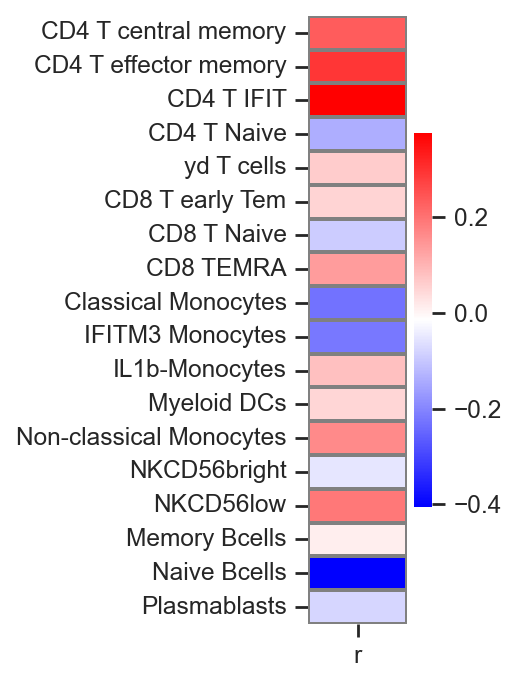

In [18]:
plt.rcParams['figure.figsize'] = [1, 5]
heatmap_df = pd.DataFrame.from_dict(values_dict, orient="index")
heatmap_df = heatmap_df[["r"]]
heatmap_df.to_csv("./figures/RawFigureData/FigureS7B_raw.csv")
sns.heatmap(heatmap_df, cmap = "bwr", linewidths=1, linecolor="grey")
plt.savefig('correlationdas28.pdf')
